# Fraud Detection In Rent Payments


### Task: Develop an ML model to detect fraudulent rental transactions using historical tenant behavior and transaction data.

In [2]:
!pip install xgboost


[notice] A new release of pip is available: 25.0 -> 25.0.1
[notice] To update, run: pip install --upgrade pip


In [493]:
import joblib
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM
from sklearn.metrics import classification_report, roc_auc_score, precision_recall_curve
from sklearn.ensemble import IsolationForest
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import precision_recall_curve, auc, confusion_matrix, roc_curve, roc_auc_score, log_loss, accuracy_score
from sklearn.ensemble import IsolationForest

In [4]:
train_transaction_data = pd.read_csv('ieee-fraud-detection/train_transaction.csv')
train_identity_data = pd.read_csv('ieee-fraud-detection/train_identity.csv')
df = train_transaction_data.merge(train_identity_data, on='TransactionID', how='left')
df.to_csv(r'ieee-fraud-detection/train_data.csv')


test_transaction_data = pd.read_csv('ieee-fraud-detection/test_transaction.csv')
test_identity_data = pd.read_csv('ieee-fraud-detection/test_identity.csv')
df_test = test_transaction_data.merge(test_identity_data, on='TransactionID', how='left')
df_test.to_csv(r'ieee-fraud-detection/test_data.csv')


## Step 2: Data Exploration and Preprocessing


### i. Check for missing values and impute them where necessary.
### ii. Normalize or scale numerical features.
### iii. Encode categorical features (e.g., DeviceType, ProductCD).

In [7]:
df.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 590540 entries, 0 to 590539
Columns: 434 entries, TransactionID to DeviceInfo
dtypes: float64(399), int64(4), object(31)
memory usage: 1.9+ GB


In [9]:
df.columns

Index(['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt',
       'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5',
       ...
       'id_31', 'id_32', 'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38',
       'DeviceType', 'DeviceInfo'],
      dtype='object', length=434)

In [10]:
df.describe()

,TransactionID,isFraud,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,...,id_17,id_18,id_19,id_20,id_21,id_22,id_24,id_25,id_26,id_32
count,5.905400e+05,590540.000000,5.905400e+05,590540.000000,590540.000000,581607.000000,588975.000000,586281.000000,524834.000000,524834.000000,...,139369.000000,45113.000000,139318.000000,139261.000000,5159.000000,5169.000000,4747.000000,5132.000000,5163.000000,77586.000000
mean,3.282270e+06,0.034990,7.372311e+06,135.027176,9898.734658,362.555488,153.194925,199.278897,290.733794,86.800630,...,189.451377,14.237337,353.128174,403.882666,368.269820,16.002708,12.800927,329.608924,149.070308,26.508597
std,1.704744e+05,0.183755,4.617224e+06,239.162522,4901.170153,157.793246,11.336444,41.244453,101.741072,2.690623,...,30.375360,1.561302,141.095343,152.160327,198.847038,6.897665,2.372447,97.461089,32.101995,3.737502
min,2.987000e+06,0.000000,8.640000e+04,0.251000,1000.000000,100.000000,100.000000,100.000000,100.000000,10.000000,...,100.000000,10.000000,100.000000,100.000000,100.000000,10.000000,11.000000,100.000000,100.000000,0.000000
25%,3.134635e+06,0.000000,3.027058e+06,43.321000,6019.000000,214.000000,150.000000,166.000000,204.000000,87.000000,...,166.000000,13.000000,266.000000,256.000000,252.000000,14.000000,11.000000,321.000000,119.000000,24.000000
50%,3.282270e+06,0.000000,7.306528e+06,68.769000,9678.000000,361.000000,150.000000,226.000000,299.000000,87.000000,...,166.000000,15.000000,341.000000,472.000000,252.000000,14.000000,11.000000,321.000000,149.000000,24.000000
75%,3.429904e+06,0.000000,1.124662e+07,125.000000,14184.000000,512.000000,150.000000,226.000000,330.000000,87.000000,...,225.000000,15.000000,427.000000,533.000000,486.500000,14.000000,15.000000,371.000000,169.000000,32.000000
max,3.577539e+06,1.000000,1.581113e+07,31937.391000,18396.000000,600.000000,231.000000,237.000000,540.000000,102.000000,...,229.000000,29.000000,671.000000,661.000000,854.000000,44.000000,26.000000,548.000000,216.000000,32.000000


In [11]:
missing_values = df.isnull().sum()
missing_values = missing_values[missing_values > 0]  
print("Columns with missing values:\n", missing_values)

Columns with missing values:
 card2           8933
card3           1565
card4           1577
card5           4259
card6           1571
               ...  
id_36         449555
id_37         449555
id_38         449555
DeviceType    449730
DeviceInfo    471874
Length: 414, dtype: int64


In [12]:
no_missing_values = missing_values[missing_values == 0]  
print("Columns with no missing values:\n", no_missing_values)

Columns with no missing values:
 Series([], dtype: int64)


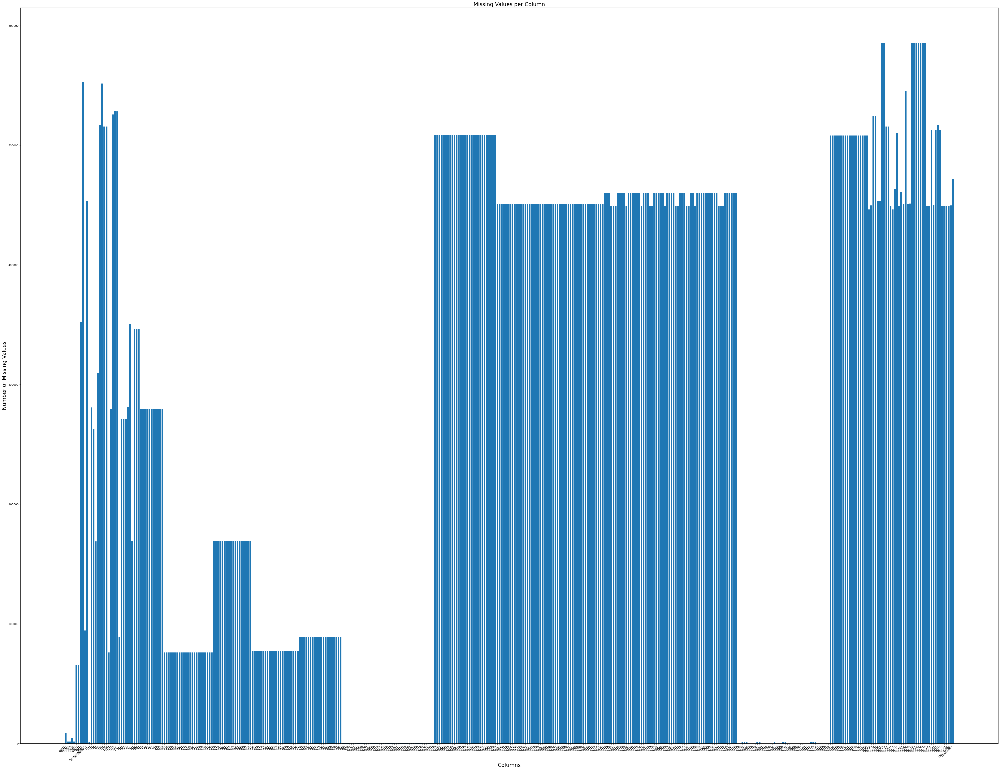

In [13]:
missing_values = df.isnull().sum()
missing_values = missing_values[missing_values > 0]  
plt.figure(figsize=(66, 50))
plt.bar(missing_values.index, missing_values.values)
plt.xlabel("Columns", fontsize=20)
plt.ylabel("Number of Missing Values", fontsize=20)
plt.title("Missing Values per Column", fontsize=20)
plt.xticks(rotation=45, ha='right')
plt.show()

In [14]:
train_transaction_data.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [15]:
train_transaction_data.columns

Index(['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt',
       'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5',
       ...
       'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 'V337', 'V338',
       'V339'],
      dtype='object', length=394)

In [16]:
train_identity_data.head()

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
1,2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,...,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2,2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
3,2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
4,2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,...,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS


In [17]:
train_identity_data.columns

Index(['TransactionID', 'id_01', 'id_02', 'id_03', 'id_04', 'id_05', 'id_06',
       'id_07', 'id_08', 'id_09', 'id_10', 'id_11', 'id_12', 'id_13', 'id_14',
       'id_15', 'id_16', 'id_17', 'id_18', 'id_19', 'id_20', 'id_21', 'id_22',
       'id_23', 'id_24', 'id_25', 'id_26', 'id_27', 'id_28', 'id_29', 'id_30',
       'id_31', 'id_32', 'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38',
       'DeviceType', 'DeviceInfo'],
      dtype='object')

In [18]:
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
print("Numerical Columns:", numerical_cols)

Numerical Columns: Index(['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt', 'card1',
       'card2', 'card3', 'card5', 'addr1', 'addr2',
       ...
       'id_17', 'id_18', 'id_19', 'id_20', 'id_21', 'id_22', 'id_24', 'id_25',
       'id_26', 'id_32'],
      dtype='object', length=403)


## Filling of Missing Values in Numerical Columns by Mean Values

In [20]:
#df[numerical_cols] = df[numerical_cols].fillna(df[numerical_cols].mean())
df.fillna(df.mean(numeric_only=True), inplace=True)
df_test.fillna(df_test.mean(numeric_only=True), inplace=True)

### We should be scaling all the columns as it will impact the prediction

In [22]:
# scaler = StandardScaler()
# df[numerical_cols] = scaler.fit_transform(df[numerical_cols])

In [23]:
# for col in numerical_cols:
#     print(col)

In [24]:
categorical_cols = df.select_dtypes(include=['object']).columns
print("Categorical Columns:", categorical_cols)

Categorical Columns: Index(['ProductCD', 'card4', 'card6', 'P_emaildomain', 'R_emaildomain', 'M1',
       'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'id_12', 'id_15',
       'id_16', 'id_23', 'id_27', 'id_28', 'id_29', 'id_30', 'id_31', 'id_33',
       'id_34', 'id_35', 'id_36', 'id_37', 'id_38', 'DeviceType',
       'DeviceInfo'],
      dtype='object')


## Filling of Missing Values in Categorical Columns by Median Values

In [135]:
for col in categorical_cols:
    mode_value = df[col].mode()[0]  
    df[col].fillna(mode_value, inplace=True) 
    print(f"Column: {col}, Unique Values: {df[col].unique()}")

/var/folders/3q/gmr6b7zs7ns8f20xc16hk7t40000gn/T/ipykernel_56326/1133082125.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(mode_value, inplace=True)


Column: ProductCD, Unique Values: ['W' 'H' 'C' 'S' 'R']
Column: card4, Unique Values: ['discover' 'mastercard' 'visa' 'american express']
Column: card6, Unique Values: ['credit' 'debit' 'debit or credit' 'charge card']
Column: P_emaildomain, Unique Values: ['gmail.com' 'outlook.com' 'yahoo.com' 'mail.com' 'anonymous.com'
 'hotmail.com' 'verizon.net' 'aol.com' 'me.com' 'comcast.net'
 'optonline.net' 'cox.net' 'charter.net' 'rocketmail.com' 'prodigy.net.mx'
 'embarqmail.com' 'icloud.com' 'live.com.mx' 'gmail' 'live.com' 'att.net'
 'juno.com' 'ymail.com' 'sbcglobal.net' 'bellsouth.net' 'msn.com' 'q.com'
 'yahoo.com.mx' 'centurylink.net' 'servicios-ta.com' 'earthlink.net'
 'hotmail.es' 'cfl.rr.com' 'roadrunner.com' 'netzero.net' 'gmx.de'
 'suddenlink.net' 'frontiernet.net' 'windstream.net' 'frontier.com'
 'outlook.es' 'mac.com' 'netzero.com' 'aim.com' 'web.de' 'twc.com'
 'cableone.net' 'yahoo.fr' 'yahoo.de' 'yahoo.es' 'sc.rr.com' 'ptd.net'
 'live.fr' 'yahoo.co.uk' 'hotmail.fr' 'hotmail.de'

In [137]:
categorical_cols = df_test.select_dtypes(include=['object']).columns
print("Categorical Columns:", categorical_cols)



for col in categorical_cols:
    mode_value = df_test[col].mode()[0]  
    df_test[col].fillna(mode_value, inplace=True) 
    print(f"Column: {col}, Unique Values: {df_test[col].unique()}")

Categorical Columns: Index(['ProductCD', 'card4', 'card6', 'P_emaildomain', 'R_emaildomain', 'M1',
       'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'id-12', 'id-15',
       'id-16', 'id-23', 'id-27', 'id-28', 'id-29', 'id-30', 'id-31', 'id-33',
       'id-34', 'id-35', 'id-36', 'id-37', 'id-38', 'DeviceType',
       'DeviceInfo'],
      dtype='object')
Column: ProductCD, Unique Values: ['W' 'C' 'S' 'H' 'R']
Column: card4, Unique Values: ['visa' 'mastercard' 'american express' 'discover']


/var/folders/3q/gmr6b7zs7ns8f20xc16hk7t40000gn/T/ipykernel_56326/1164746249.py:8: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test[col].fillna(mode_value, inplace=True)


Column: card6, Unique Values: ['debit' 'credit' 'charge card']
Column: P_emaildomain, Unique Values: ['gmail.com' 'aol.com' 'hotmail.com' 'att.net' 'twc.com' 'yahoo.com'
 'verizon.net' 'anonymous.com' 'msn.com' 'q.com' 'outlook.com'
 'icloud.com' 'bellsouth.net' 'sbcglobal.net' 'web.de' 'live.com.mx'
 'ymail.com' 'comcast.net' 'mail.com' 'cox.net' 'me.com' 'aim.com'
 'charter.net' 'rocketmail.com' 'outlook.es' 'centurylink.net' 'live.com'
 'yahoo.de' 'cfl.rr.com' 'mac.com' 'frontier.com' 'netzero.net'
 'frontiernet.net' 'juno.com' 'windstream.net' 'yahoo.fr' 'netzero.com'
 'optonline.net' 'yahoo.co.uk' 'cableone.net' 'roadrunner.com' 'sc.rr.com'
 'earthlink.net' 'gmail' 'hotmail.de' 'yahoo.com.mx' 'suddenlink.net'
 'yahoo.es' 'embarqmail.com' 'hotmail.es' 'ptd.net' 'hotmail.co.uk'
 'protonmail.com' 'live.fr' 'prodigy.net.mx' 'yahoo.co.jp' 'hotmail.fr'
 'gmx.de' 'servicios-ta.com' 'scranton.edu']
Column: R_emaildomain, Unique Values: ['gmail.com' 'hotmail.com' 'anonymous.com' 'att.net' 

## Featuring Engineering

- Analyzing time-based spending patterns
- Analyzing frequency
- Analyzing transaction location anomalies

/var/folders/3q/gmr6b7zs7ns8f20xc16hk7t40000gn/T/ipykernel_56326/3325581290.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ProductCD_counts.index, y=ProductCD_counts.values, palette="viridis")


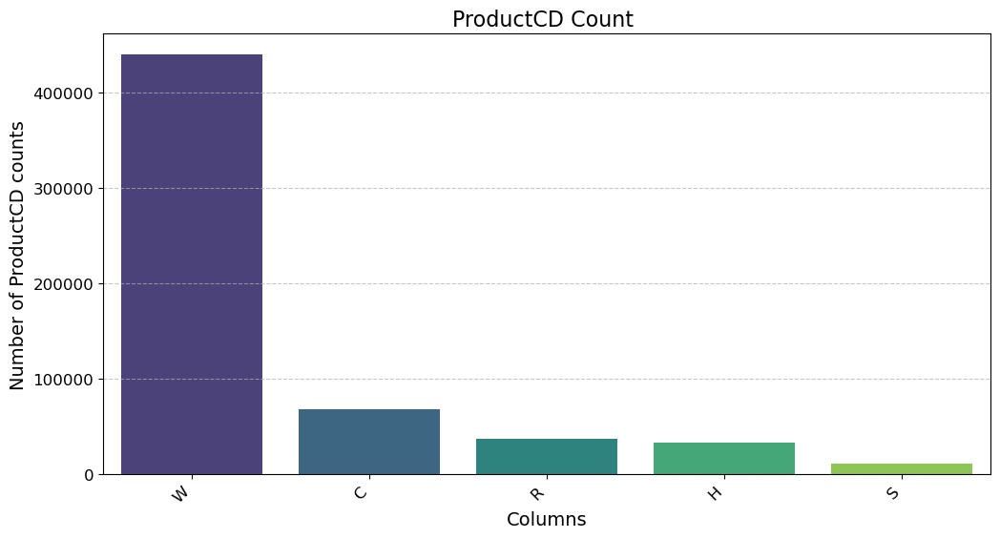

In [139]:
ProductCD_counts=df['ProductCD'].value_counts()
plt.figure(figsize=(12, 6))
sns.barplot(x=ProductCD_counts.index, y=ProductCD_counts.values, palette="viridis")
plt.xlabel("Columns", fontsize=14)
plt.ylabel("Number of ProductCD counts", fontsize=14)
plt.title("ProductCD Count ", fontsize=16)
plt.xticks(rotation=45, ha="right", fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle="--", alpha=0.7)
plt.show()

/var/folders/3q/gmr6b7zs7ns8f20xc16hk7t40000gn/T/ipykernel_56326/3301425709.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=card4_counts.index, y=card4_counts.values, palette="viridis")


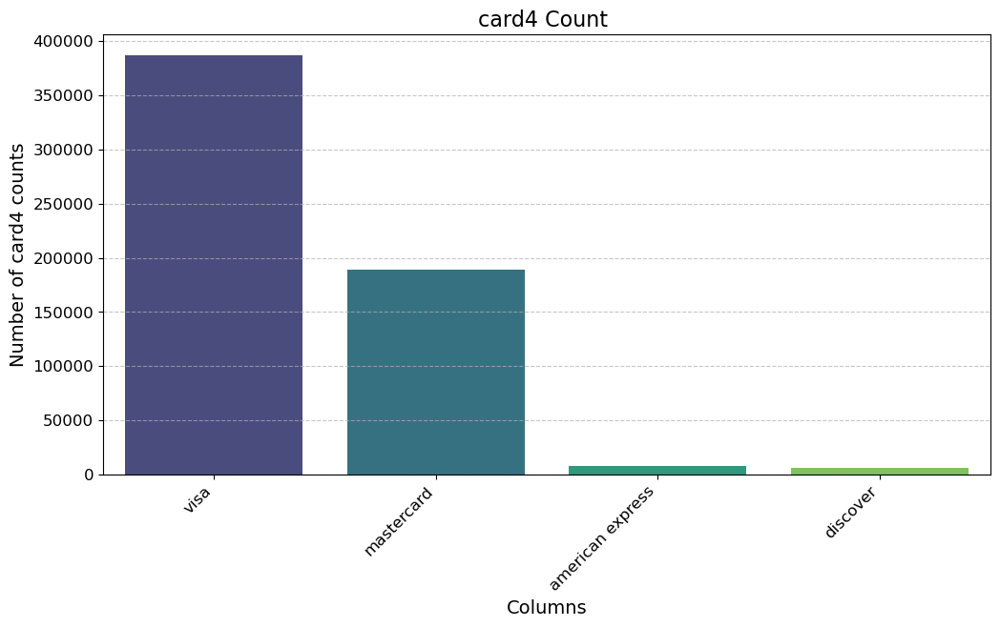

In [141]:
card4_counts=df['card4'].value_counts()
plt.figure(figsize=(12, 6))
sns.barplot(x=card4_counts.index, y=card4_counts.values, palette="viridis")
plt.xlabel("Columns", fontsize=14)
plt.ylabel("Number of card4 counts", fontsize=14)
plt.title("card4 Count ", fontsize=16)
plt.xticks(rotation=45, ha="right", fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle="--", alpha=0.7)
plt.show()

/var/folders/3q/gmr6b7zs7ns8f20xc16hk7t40000gn/T/ipykernel_56326/2073297175.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=card6_counts.index, y=card6_counts.values, palette="viridis")


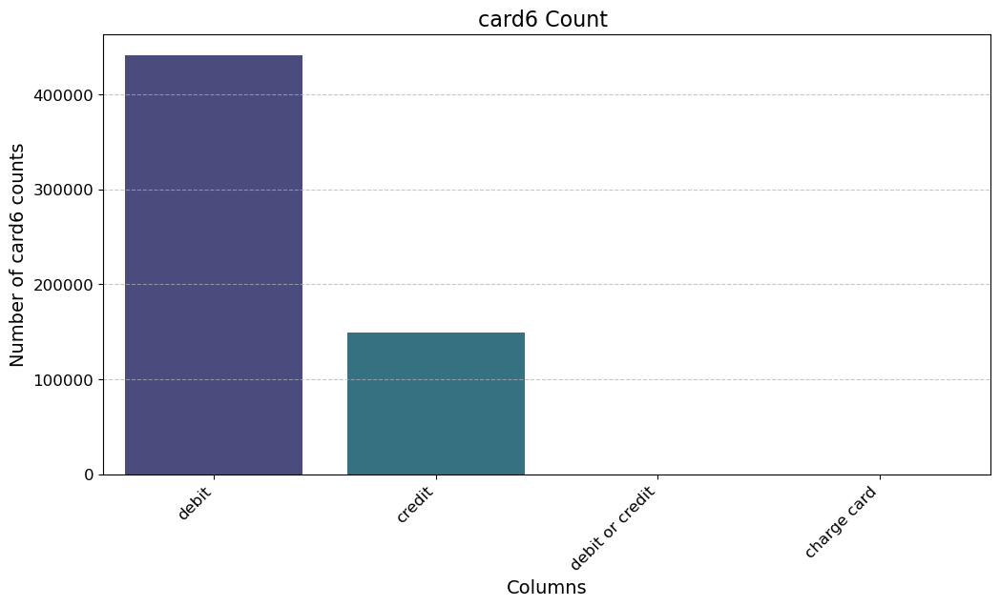

In [143]:
card6_counts=df['card6'].value_counts()
plt.figure(figsize=(12, 6))
sns.barplot(x=card6_counts.index, y=card6_counts.values, palette="viridis")
plt.xlabel("Columns", fontsize=14)
plt.ylabel("Number of card6 counts", fontsize=14)
plt.title("card6 Count ", fontsize=16)
plt.xticks(rotation=45, ha="right", fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle="--", alpha=0.7)
plt.show()

/var/folders/3q/gmr6b7zs7ns8f20xc16hk7t40000gn/T/ipykernel_56326/380356918.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=match_counts.index, y=match_counts.values, palette="viridis")


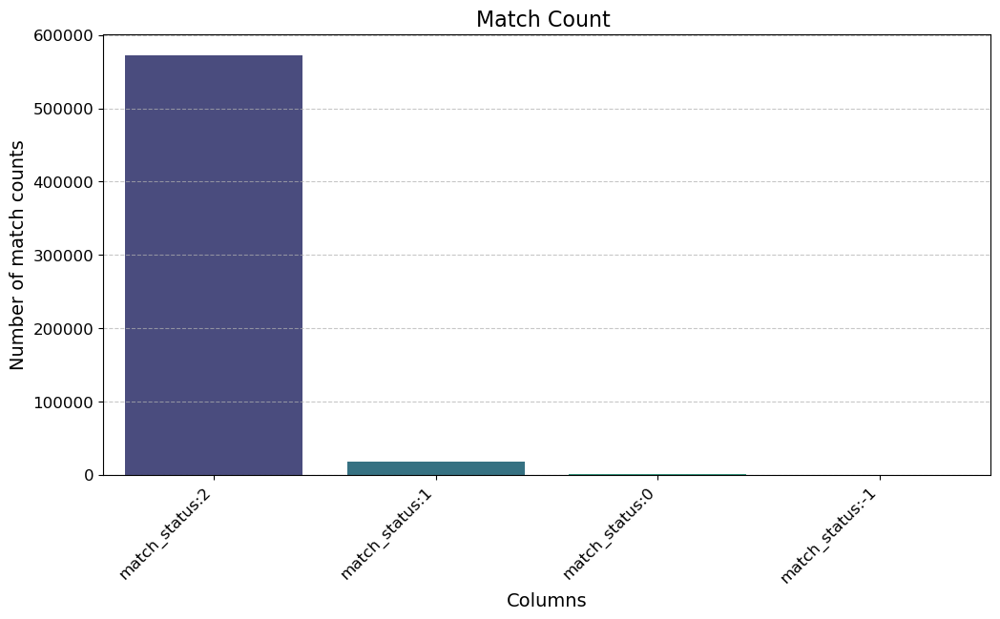

In [145]:
match_counts=df['id_34'].value_counts()
plt.figure(figsize=(12, 6))
sns.barplot(x=match_counts.index, y=match_counts.values, palette="viridis")
plt.xlabel("Columns", fontsize=14)
plt.ylabel("Number of match counts", fontsize=14)
plt.title("Match Count ", fontsize=16)
plt.xticks(rotation=45, ha="right", fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle="--", alpha=0.7)
plt.show()

/var/folders/3q/gmr6b7zs7ns8f20xc16hk7t40000gn/T/ipykernel_56326/2972373949.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=DeviceType_counts.index, y=DeviceType_counts.values, palette="viridis")


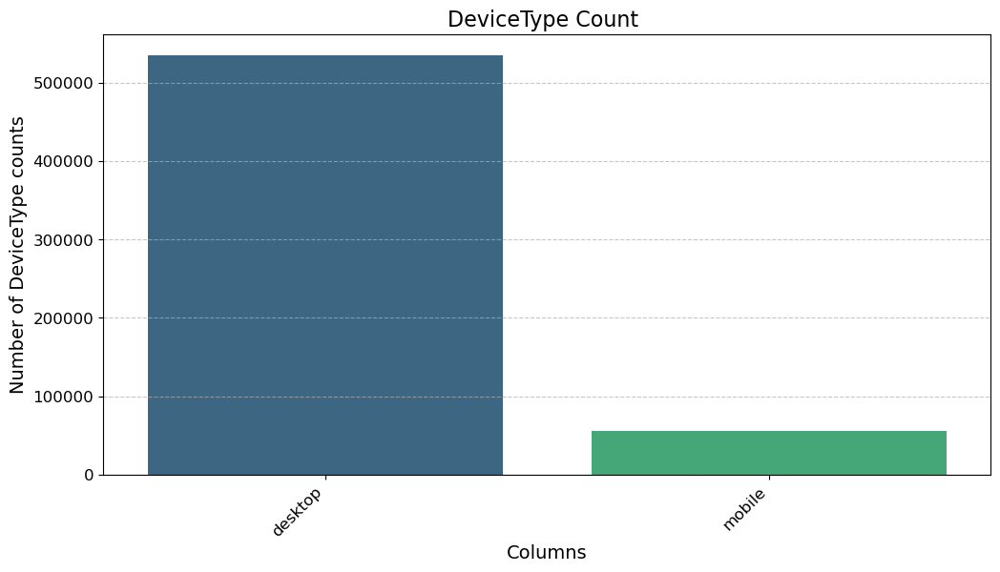

In [146]:
DeviceType_counts=df['DeviceType'].value_counts()
plt.figure(figsize=(12, 6))
sns.barplot(x=DeviceType_counts.index, y=DeviceType_counts.values, palette="viridis")
plt.xlabel("Columns", fontsize=14)
plt.ylabel("Number of DeviceType counts", fontsize=14)
plt.title("DeviceType Count ", fontsize=16)
plt.xticks(rotation=45, ha="right", fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle="--", alpha=0.7)
plt.show()

/var/folders/3q/gmr6b7zs7ns8f20xc16hk7t40000gn/T/ipykernel_56326/2887790295.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ip_address_counts.index, y=ip_address_counts.values, palette="viridis")


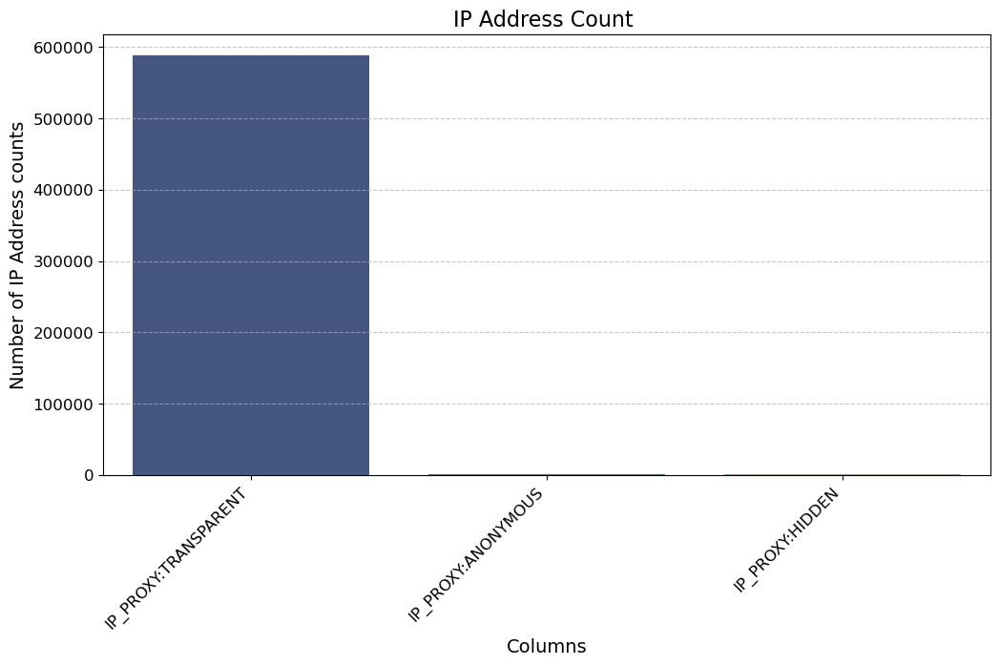

In [148]:
ip_address_counts=df['id_23'].value_counts()
plt.figure(figsize=(12, 6))
sns.barplot(x=ip_address_counts.index, y=ip_address_counts.values, palette="viridis")
plt.xlabel("Columns", fontsize=14)
plt.ylabel("Number of IP Address counts", fontsize=14)
plt.title("IP Address Count ", fontsize=16)
plt.xticks(rotation=45, ha="right", fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle="--", alpha=0.7)
plt.show()

### Mapping product_cd_category,card4_category, card6_category, true_false_category,device_category, ip_category, id_category column using label encoding

In [152]:
product_cd_category={'W' :0,'H':1, 'C':2, 'S' :3,'R':4}
card4_category={'discover':0, 'mastercard':1, 'visa':2, 'american express':3}
card6_category={'credit':0, 'debit':1, 'debit or credit':3, 'charge card':4}
true_false_category={'T':0,'F':1}
device_category={'desktop':0, 'mobile':1}
ip_category={'IP_PROXY:TRANSPARENT':0,'IP_PROXY:ANONYMOUS':1, 'IP_PROXY:HIDDEN':2}
id_category={'Found':0,'NotFound':1,'New':2,'Unknown':3}

In [154]:
df['product_cd_category'] = df['ProductCD'].map(product_cd_category)
df['card4_category']=df['card4'].map(card4_category)
df['card6_category']=df['card6'].map(card6_category)
df['M1_category']=df['M1'].map(true_false_category)
df['M2_category']=df['M2'].map(true_false_category)
df['M3_category']=df['M3'].map(true_false_category)
df['M5_category']=df['M5'].map(true_false_category)
df['M6_category']=df['M6'].map(true_false_category)
df['M7_category']=df['M7'].map(true_false_category)
df['M8_category']=df['M8'].map(true_false_category)
df['M9_category']=df['M9'].map(true_false_category)
df['id_35_category']=df['id_35'].map(true_false_category)
df['id_36_category']=df['id_36'].map(true_false_category)
df['id_37_category']=df['id_37'].map(true_false_category)
df['id_38_category']=df['id_38'].map(true_false_category)
df['device_category']=df['DeviceType'].map(device_category)
df['ip_category']=df['id_23'].map(ip_category)
df['id_12_category']=df['id_12'].map(id_category)
df['id_15_category']=df['id_15'].map(id_category)
df['id_16_category']=df['id_16'].map(id_category)
df['id_27_category']=df['id_27'].map(id_category)
df['id_28_category']=df['id_28'].map(id_category)
df['id_29_category']=df['id_29'].map(id_category)

In [156]:
df_test['product_cd_category'] = df_test['ProductCD'].map(product_cd_category)
df_test['card4_category']=df_test['card4'].map(card4_category)
df_test['card6_category']=df_test['card6'].map(card6_category)
df_test['M1_category']=df_test['M1'].map(true_false_category)
df_test['M2_category']=df_test['M2'].map(true_false_category)
df_test['M3_category']=df_test['M3'].map(true_false_category)
df_test['M5_category']=df_test['M5'].map(true_false_category)
df_test['M6_category']=df_test['M6'].map(true_false_category)
df_test['M7_category']=df_test['M7'].map(true_false_category)
df_test['M8_category']=df_test['M8'].map(true_false_category)
df_test['M9_category']=df_test['M9'].map(true_false_category)
df_test['id_35_category']=df_test['id-35'].map(true_false_category)
df_test['id_36_category']=df_test['id-36'].map(true_false_category)
df_test['id_37_category']=df_test['id-37'].map(true_false_category)
df_test['id_38_category']=df_test['id-38'].map(true_false_category)
df_test['device_category']=df_test['DeviceType'].map(device_category)
df_test['ip_category']=df_test['id-23'].map(ip_category)
df_test['id_12_category']=df_test['id-12'].map(id_category)
df_test['id_15_category']=df_test['id-15'].map(id_category)
df_test['id_16_category']=df_test['id-16'].map(id_category)
df_test['id_27_category']=df_test['id-27'].map(id_category)
df_test['id_28_category']=df_test['id-28'].map(id_category)
df_test['id_29_category']=df_test['id-29'].map(id_category)

In [157]:
df.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_37_category,id_38_category,device_category,ip_category,id_12_category,id_15_category,id_16_category,id_27_category,id_28_category,id_29_category
0,2987000,0,86400,68.5,W,13926,362.555488,150.0,discover,142.0,...,0,1,0,0,1,0,0,0,0,0
1,2987001,0,86401,29.0,W,2755,404.000000,150.0,mastercard,102.0,...,0,1,0,0,1,0,0,0,0,0
2,2987002,0,86469,59.0,W,4663,490.000000,150.0,visa,166.0,...,0,1,0,0,1,0,0,0,0,0
3,2987003,0,86499,50.0,W,18132,567.000000,150.0,mastercard,117.0,...,0,1,0,0,1,0,0,0,0,0
4,2987004,0,86506,50.0,H,4497,514.000000,150.0,mastercard,102.0,...,0,0,1,0,1,2,1,0,2,1


In [160]:
df_test.head()

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id_37_category,id_38_category,device_category,ip_category,id_12_category,id_15_category,id_16_category,id_27_category,id_28_category,id_29_category
0,3663549,18403224,31.95,W,10409,111.0,150.0,visa,226.0,debit,...,0,1,0,0,1,0,0,0,0,0
1,3663550,18403263,49.00,W,4272,111.0,150.0,visa,226.0,debit,...,0,1,0,0,1,0,0,0,0,0
2,3663551,18403310,171.00,W,4476,574.0,150.0,visa,226.0,debit,...,0,1,0,0,1,0,0,0,0,0
3,3663552,18403310,284.95,W,10989,360.0,150.0,visa,166.0,debit,...,0,1,0,0,1,0,0,0,0,0
4,3663553,18403317,67.95,W,18018,452.0,150.0,mastercard,117.0,debit,...,0,1,0,0,1,0,0,0,0,0


In [316]:
df_test['card4'].head()

0          visa
1          visa
2          visa
3          visa
4    mastercard
Name: card4, dtype: object

In [162]:
for col in df_test.columns:
    print(f"{col}: {df_test[col].isnull().sum()} missing values")


TransactionID: 0 missing values
TransactionDT: 0 missing values
TransactionAmt: 0 missing values
ProductCD: 0 missing values
card1: 0 missing values
card2: 0 missing values
card3: 0 missing values
card4: 0 missing values
card5: 0 missing values
card6: 0 missing values
addr1: 0 missing values
addr2: 0 missing values
dist1: 0 missing values
dist2: 0 missing values
P_emaildomain: 0 missing values
R_emaildomain: 0 missing values
C1: 0 missing values
C2: 0 missing values
C3: 0 missing values
C4: 0 missing values
C5: 0 missing values
C6: 0 missing values
C7: 0 missing values
C8: 0 missing values
C9: 0 missing values
C10: 0 missing values
C11: 0 missing values
C12: 0 missing values
C13: 0 missing values
C14: 0 missing values
D1: 0 missing values
D2: 0 missing values
D3: 0 missing values
D4: 0 missing values
D5: 0 missing values
D6: 0 missing values
D7: 0 missing values
D8: 0 missing values
D9: 0 missing values
D10: 0 missing values
D11: 0 missing values
D12: 0 missing values
D13: 0 missing va

In [163]:
nan_cols = df_test.isnull().sum()
nan_cols = nan_cols[nan_cols > 0] 
print(nan_cols)

Series([], dtype: int64)


## Observation - 

- The columns (id_30, id_31) are redundant columns as the same values are present in the device info and device type column.

- The column id_33 is also redundant as it displays the size of the device which is of no use right now

In [168]:
df['DeviceInfo'].nunique()

1786

In [170]:
plt.figure(figsize=(60, 200))
sns.barplot(x=df['DeviceInfo'].index, y=df['DeviceInfo'].values, palette="viridis")
plt.xlabel("Columns", fontsize=14)
plt.ylabel("Number of Device Info", fontsize=14)
plt.title("DeviceInfo Count ", fontsize=16)
plt.xticks(rotation=45, ha="right", fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle="--", alpha=0.7)
plt.show()

/var/folders/3q/gmr6b7zs7ns8f20xc16hk7t40000gn/T/ipykernel_56326/1149033951.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=df['DeviceInfo'].index, y=df['DeviceInfo'].values, palette="viridis")


In [171]:
df['DeviceInfo'].unique()

array(['Windows', 'SAMSUNG SM-G892A Build/NRD90M', 'iOS Device', ...,
       'LDN-LX3 Build/HUAWEILDN-LX3', 'Z955A', 'LG-E975'], dtype=object)

In [172]:
df['DeviceInfo'].nunique()

1786

### Mapping deviceinfo column using label encoding

In [174]:
device_info_counts = df['DeviceInfo'].value_counts()
top_device_counts = device_info_counts.index[:2] 
print(top_device_counts)
df["DeviceInfo_category"] = df["DeviceInfo"].apply(lambda x: x if x in top_device_counts else "Other")
DeviceInfo_category_counts = df["DeviceInfo_category"].value_counts()
print(DeviceInfo_category_counts)
DeviceInfo_categories={'Windows':0,'Other':1,'iOS Device':2}

Index(['Windows', 'iOS Device'], dtype='object', name='DeviceInfo')
DeviceInfo_category
Windows       519596
Other          51162
iOS Device     19782
Name: count, dtype: int64


In [175]:
def categorize_device(device):
    if isinstance(device, str):  
        if 'Windows' in device:
            return 'Windows'
        elif 'iOS' in device or 'iPhone' in device or 'iPad' in device:
            return 'iOS Device'
        else:
            return 'Other'
    return 'Other'  
df["DeviceInfo_category"] = df["DeviceInfo"].apply(categorize_device)
df["DeviceInfo_category"] = df["DeviceInfo_category"].map(DeviceInfo_categories)

df_test["DeviceInfo_category"] = df_test["DeviceInfo"].apply(categorize_device)
df_test["DeviceInfo_category"] = df_test["DeviceInfo_category"].map(DeviceInfo_categories)

In [176]:
unique_email_counts = df[['P_emaildomain', 'R_emaildomain']].nunique()
print(unique_email_counts)

P_emaildomain    59
R_emaildomain    60
dtype: int64


In [177]:
P_emaildomain_freq = df['P_emaildomain'].value_counts()  
R_emaildomain_freq = df['R_emaildomain'].value_counts()

/var/folders/3q/gmr6b7zs7ns8f20xc16hk7t40000gn/T/ipykernel_56326/905731344.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=P_emaildomain_freq.index, y=P_emaildomain_freq.values, palette="viridis")


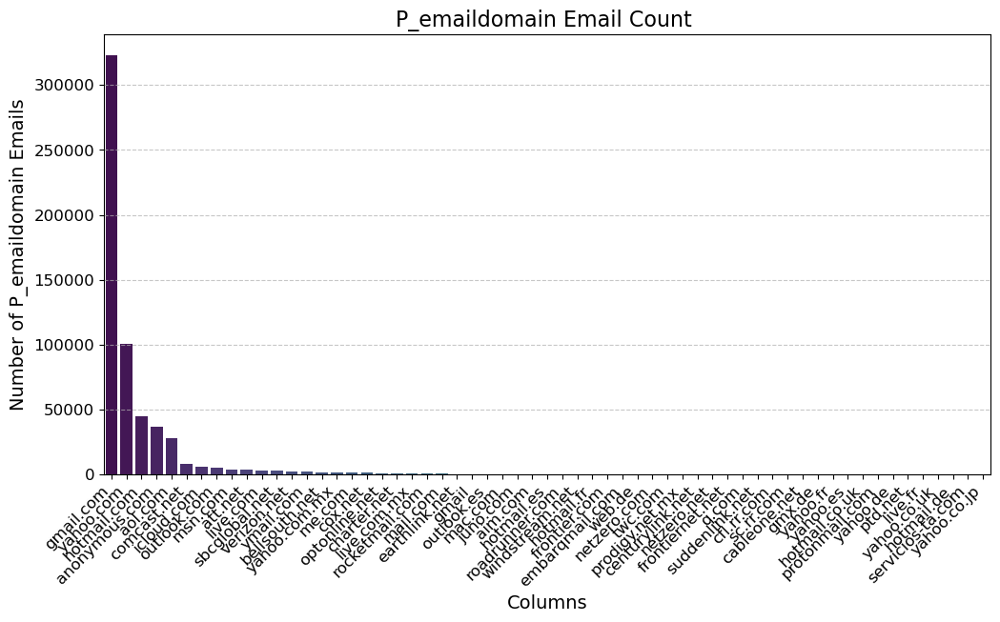

In [178]:
plt.figure(figsize=(12, 6))
sns.barplot(x=P_emaildomain_freq.index, y=P_emaildomain_freq.values, palette="viridis")
plt.xlabel("Columns", fontsize=14)
plt.ylabel("Number of P_emaildomain Emails", fontsize=14)
plt.title("P_emaildomain Email Count ", fontsize=16)
plt.xticks(rotation=45, ha="right", fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle="--", alpha=0.7)
plt.show()

In [180]:
P_email_counts = df["P_emaildomain"].value_counts()
top_domains = P_email_counts.index[:2] 
df["P_email_category"] = df["P_emaildomain"].apply(lambda x: x if x in top_domains else "Other")
P_email_category_counts = df["P_email_category"].value_counts()
P_email_category_counts

P_email_category
gmail.com    322811
Other        166795
yahoo.com    100934
Name: count, dtype: int64

/var/folders/3q/gmr6b7zs7ns8f20xc16hk7t40000gn/T/ipykernel_56326/3977057759.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=R_emaildomain_freq.index, y=R_emaildomain_freq.values, palette="viridis")


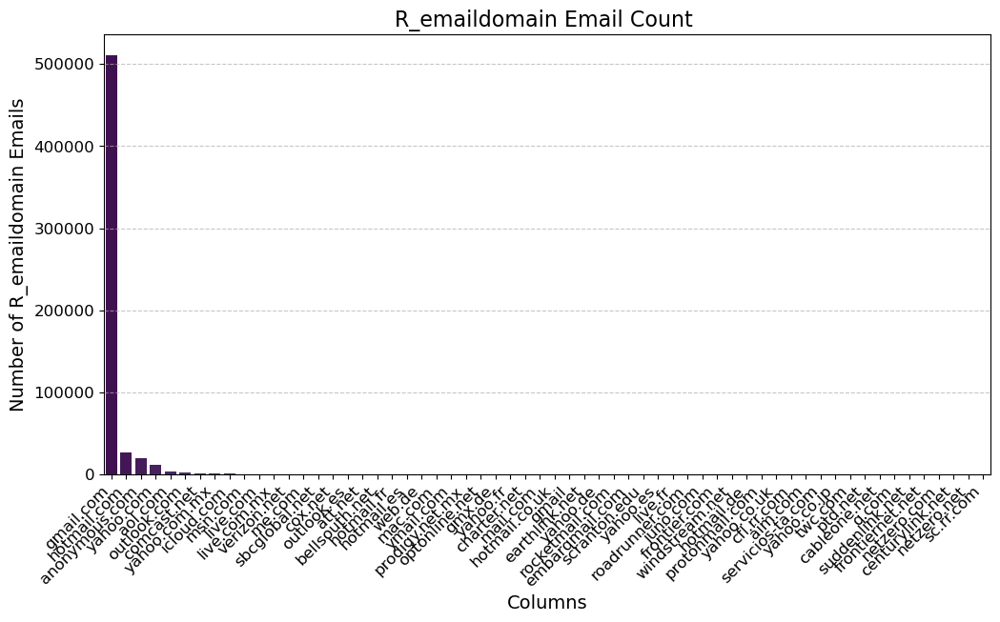

In [181]:
plt.figure(figsize=(12, 6))
sns.barplot(x=R_emaildomain_freq.index, y=R_emaildomain_freq.values, palette="viridis")
plt.xlabel("Columns", fontsize=14)
plt.ylabel("Number of R_emaildomain Emails", fontsize=14)
plt.title("R_emaildomain Email Count ", fontsize=16)
plt.xticks(rotation=45, ha="right", fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle="--", alpha=0.7)
plt.show()

In [182]:
R_email_counts = df["R_emaildomain"].value_counts()
top_domains = R_email_counts.index[:2] 
df["R_email_category"] = df["R_emaildomain"].apply(lambda x: x if x in top_domains else "Other")
R_email_category_counts = df["R_email_category"].value_counts()
R_email_category_counts
r_email_categories={'gmail.com':0,'Other':1,'hotmail.com':2}

/var/folders/3q/gmr6b7zs7ns8f20xc16hk7t40000gn/T/ipykernel_56326/1619981249.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=P_email_category_counts.index, y=P_email_category_counts.values, palette="magma", ax=axes[0])
/var/folders/3q/gmr6b7zs7ns8f20xc16hk7t40000gn/T/ipykernel_56326/1619981249.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=R_email_category_counts.index, y=R_email_category_counts.values, palette="plasma", ax=axes[1])


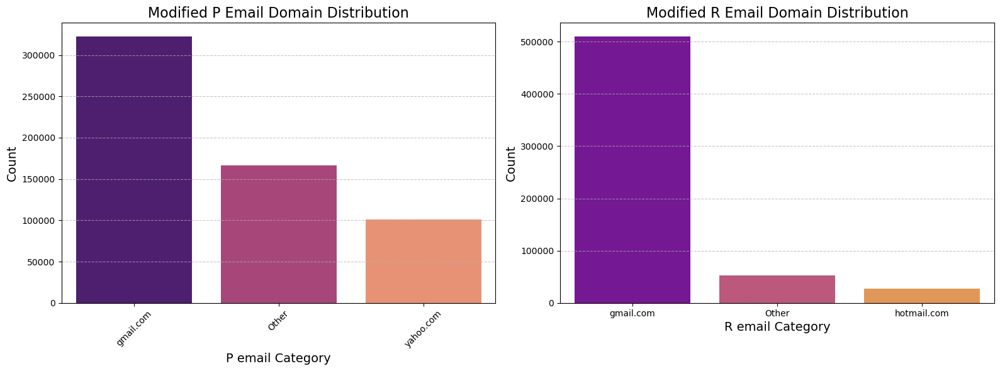

In [183]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
sns.barplot(x=P_email_category_counts.index, y=P_email_category_counts.values, palette="magma", ax=axes[0])
axes[0].set_xlabel("P email Category", fontsize=14)
axes[0].set_ylabel("Count", fontsize=14)
axes[0].set_title("Modified P Email Domain Distribution", fontsize=16)
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(axis='y', linestyle="--", alpha=0.7)
sns.barplot(x=R_email_category_counts.index, y=R_email_category_counts.values, palette="plasma", ax=axes[1])
axes[1].set_xlabel("R email Category", fontsize=14)
axes[1].set_ylabel("Count", fontsize=14)
axes[1].set_title("Modified R Email Domain Distribution", fontsize=16)
axes[1].grid(axis='y', linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

### Mapping p_email_domain column using label encoding

In [186]:
def categorize_p_email(email):
    if isinstance(email, str):  
        if 'gmail.com' in email:
            return 'gmail.com'
        elif 'yahoo.com' in email:
            return 'yahoo.com'
        else:
            return 'Other'
    return 'Other'  
df["P_email_category"] = df["P_emaildomain"].apply(categorize_p_email)
df["P_email_category"] = df["P_email_category"].map(P_email_category_counts)

df_test["P_email_category"] = df_test["P_emaildomain"].apply(categorize_p_email)
df_test["P_email_category"] = df_test["P_email_category"].map(P_email_category_counts)

### Mapping r_email_domain column using label encoding

In [189]:
def categorize_r_email(email):
    if isinstance(email, str):  
        if 'gmail.com' in email:
            return 'gmail.com'
        elif 'hotmail.com' in email:
            return 'hotmail.com'
        else:
            return 'Other'
    return 'Other'  
df["R_email_category"] = df["R_emaildomain"].apply(categorize_r_email)
df["R_email_category"] = df["R_email_category"].map(R_email_category_counts)

df_test["R_email_category"] = df_test["R_emaildomain"].apply(categorize_r_email)
df_test["R_email_category"] = df_test["R_email_category"].map(R_email_category_counts)

In [190]:
df.describe()

,TransactionID,isFraud,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,...,ip_category,id_12_category,id_15_category,id_16_category,id_27_category,id_28_category,id_29_category,DeviceInfo_category,P_email_category,R_email_category
count,5.905400e+05,590540.000000,5.905400e+05,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,...,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000
mean,3.282270e+06,0.034990,7.372311e+06,135.027176,9898.734658,362.555488,153.194925,199.278897,290.733794,86.800630,...,0.003876,0.964087,0.267821,0.106709,0.000024,0.219277,0.111850,0.153544,240650.188944,447101.407393
std,1.704744e+05,0.183755,4.617224e+06,239.162522,4901.170153,156.595240,11.321413,41.095455,95.914128,2.536525,...,0.076965,0.186073,0.723238,0.308743,0.004869,0.624878,0.315182,0.443811,92756.846157,159789.935973
min,2.987000e+06,0.000000,8.640000e+04,0.251000,1000.000000,100.000000,100.000000,100.000000,100.000000,10.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,100934.000000,27509.000000
25%,3.134635e+06,0.000000,3.027058e+06,43.321000,6019.000000,215.000000,150.000000,166.000000,205.000000,87.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,166795.000000,510396.000000
50%,3.282270e+06,0.000000,7.306528e+06,68.769000,9678.000000,361.000000,150.000000,226.000000,290.733794,87.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,322811.000000,510396.000000
75%,3.429904e+06,0.000000,1.124662e+07,125.000000,14184.000000,512.000000,150.000000,226.000000,327.000000,87.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,322811.000000,510396.000000
max,3.577539e+06,1.000000,1.581113e+07,31937.391000,18396.000000,600.000000,231.000000,237.000000,540.000000,102.000000,...,2.000000,1.000000,3.000000,1.000000,1.000000,2.000000,1.000000,2.000000,322811.000000,510396.000000


In [193]:
df[['addr1', 'addr2','dist1','dist2']].describe()

,addr1,addr2,dist1,dist2
count,590540.000000,590540.000000,590540.000000,590540.000000
mean,290.733794,86.800630,118.502180,231.855423
std,95.914128,2.536525,236.212066,133.542444
min,100.000000,10.000000,0.000000,0.000000
25%,205.000000,87.000000,13.000000,231.855423
50%,290.733794,87.000000,118.502180,231.855423
75%,327.000000,87.000000,118.502180,231.855423
max,540.000000,102.000000,10286.000000,11623.000000


In [194]:
df[['addr1', 'addr2','dist1','dist2']].head(10)

,addr1,addr2,dist1,dist2
0,315.0,87.0,19.00000,231.855423
1,325.0,87.0,118.50218,231.855423
2,330.0,87.0,287.00000,231.855423
3,476.0,87.0,118.50218,231.855423
4,420.0,87.0,118.50218,231.855423
5,272.0,87.0,36.00000,231.855423
6,126.0,87.0,0.00000,231.855423
7,325.0,87.0,118.50218,231.855423
8,337.0,87.0,118.50218,231.855423
9,204.0,87.0,19.00000,231.855423


In [195]:
df[['addr1', 'addr2','dist1','dist2']].nunique()

addr1     333
addr2      75
dist1    2652
dist2    1752
dtype: int64

In [196]:
df[['addr1', 'addr2','dist1','dist2']].value_counts()

addr1       addr2     dist1      dist2     
290.733794  86.80063  118.50218  231.855423    40451
299.000000  87.00000  118.50218  231.855423    26680
325.000000  87.00000  118.50218  231.855423    22300
204.000000  87.00000  118.50218  231.855423    22055
264.000000  87.00000  118.50218  231.855423    20453
                                               ...  
272.000000  87.00000  756.00000  231.855423        1
                      778.00000  231.855423        1
                      785.00000  231.855423        1
                      791.00000  231.855423        1
540.000000  60.00000  118.50218  231.855423        1
Name: count, Length: 21787, dtype: int64

## Observation

- From the above analysis, the columns addr2, dist1, dist2 have almost the same values, adding it to increase the dimensionality of the feaure, making it redundant features. Therefore we can remove these columns from model shaping

In [198]:
 df[['D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15']].describe()

,D1,D2,D3,D4,D5,D6,D7,D8,D10,D11,D12,D13,D14,D15
count,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000
mean,94.347568,169.563231,28.343348,140.002441,42.335965,69.805717,41.638950,146.058108,123.982137,146.621465,54.037533,17.901295,57.724444,163.744579
std,157.490898,128.417246,46.469321,161.468615,61.360103,50.577056,25.604917,82.517742,170.456102,135.065439,41.139951,21.899754,44.234135,186.805646
min,0.000000,0.000000,0.000000,-122.000000,0.000000,-83.000000,0.000000,0.000000,0.000000,-53.000000,-83.000000,0.000000,-193.000000,-83.000000
25%,0.000000,88.000000,7.000000,0.000000,11.000000,69.805717,41.638950,146.058108,0.000000,31.000000,54.037533,17.901295,57.724444,0.000000
50%,3.000000,169.563231,28.343348,140.002441,42.335965,69.805717,41.638950,146.058108,43.000000,146.621465,54.037533,17.901295,57.724444,117.000000
75%,121.000000,169.563231,28.343348,140.002441,42.335965,69.805717,41.638950,146.058108,150.000000,146.621465,54.037533,17.901295,57.724444,251.000000
max,640.000000,640.000000,819.000000,869.000000,819.000000,873.000000,843.000000,1707.791626,876.000000,670.000000,648.000000,847.000000,878.000000,879.000000


In [199]:
df[['D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15']].nunique()

D1       642
D2       642
D3       650
D4       809
D5       689
D6       830
D7       598
D8     12354
D10      819
D11      677
D12      636
D13      578
D14      803
D15      860
dtype: int64

In [200]:
df[['D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15']].value_counts()

D1     D2          D3         D4          D5         D6          D7        D8          D10         D11         D12        D13        D14        D15       
0.0    169.563231  28.343348  0.000000    42.335965  69.805717   41.63895  146.058108  0.000000    0.000000    54.037533  17.901295  57.724444  0.000000      57171
                              140.002441  42.335965  69.805717   41.63895  146.058108  123.982137  146.621465  54.037533  17.901295  57.724444  163.744579    27876
                              0.000000    42.335965  69.805717   41.63895  146.058108  0.000000    146.621465  54.037533  17.901295  57.724444  0.000000      19577
                                                     0.000000    41.63895  146.058108  0.000000    146.621465  0.000000   0.000000   0.000000   0.000000      13559
                              140.002441  42.335965  69.805717   41.63895  146.058108  0.000000    0.000000    54.037533  17.901295  57.724444  0.000000       8826
                         

## Observation 
- The following columns have same value which makes them redundant and can be ignored 

In [202]:
df[['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50']].describe()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50
count,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,...,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000
mean,0.999945,1.045204,1.078075,0.846456,0.876991,1.045686,1.072870,1.027704,1.041529,0.463915,...,0.999269,0.156118,0.168942,1.083891,1.120779,1.022286,1.038515,0.383174,0.397724,0.164746
std,0.005365,0.174335,0.232963,0.319475,0.345501,0.173792,0.221267,0.135085,0.164320,0.378621,...,0.022829,0.323513,0.366149,0.540019,0.616593,0.140863,0.195903,0.429374,0.458494,0.315993
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.999945,1.000000,1.000000,0.846456,0.876991,1.000000,1.000000,1.000000,1.000000,0.000000,...,0.999269,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
50%,1.000000,1.000000,1.078075,0.846456,0.876991,1.000000,1.072870,1.000000,1.000000,0.463915,...,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.383174,0.397724,0.000000
75%,1.000000,1.045204,1.078075,1.000000,1.000000,1.045686,1.072870,1.027704,1.041529,0.463915,...,1.000000,0.156118,0.168942,1.083891,1.120779,1.022286,1.038515,1.000000,1.000000,0.164746
max,1.000000,8.000000,9.000000,6.000000,6.000000,9.000000,9.000000,8.000000,8.000000,4.000000,...,1.000000,8.000000,8.000000,48.000000,48.000000,6.000000,12.000000,5.000000,5.000000,5.000000


In [203]:
df[['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50']].nunique()

V1      3
V2     10
V3     11
V4      8
V5      8
V6     11
V7     11
V8     10
V9     10
V10     6
V11     7
V12     5
V13     8
V14     3
V15     9
V16    16
V17    17
V18    17
V19     9
V20    16
V21     7
V22    10
V23    15
V24    15
V25     8
V26    14
V27     5
V28     5
V29     7
V30     9
V31     9
V32    16
V33     8
V34    14
V35     5
V36     7
V37    56
V38    56
V39    17
V40    19
V41     3
V42    10
V43    10
V44    50
V45    50
V46     8
V47    10
V48     7
V49     7
V50     7
dtype: int64

In [204]:
df[['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50']].value_counts()

V1        V2        V3        V4        V5        V6        V7       V8        V9        V10       V11       V12       V13       V14     V15       V16      V17      V18       V19       V20       V21       V22       V23       V24       V25      V26      V27       V28      V29      V30       V31       V32       V33       V34       V35       V36       V37       V38     V39       V40       V41       V42       V43       V44       V45       V46       V47       V48       V49       V50     
0.999945  1.045204  1.078075  0.846456  0.876991  1.045686  1.07287  1.027704  1.041529  0.463915  0.478987  0.559711  0.599166  0.9995  0.122342  0.12346  0.13404  0.135363  0.816371  0.847843  0.129684  0.132292  1.034791  1.058097  0.97766  0.98804  0.000776  0.00083  0.38784  0.406436  0.140761  0.142417  0.130693  0.139154  0.542594  0.579198  1.108065  1.1624  0.166076  0.177145  0.999269  0.156118  0.168942  1.083891  1.120779  1.022286  1.038515  0.383174  0.397724  0.164746    71271
1.000000  1.000

In [205]:
df[['V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V95', 'V96', 'V97', 'V98', 'V99', 'V100' ]].describe()

,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,...,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100
count,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,...,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000
mean,0.170579,0.182695,0.577586,0.619982,1.067670,1.120979,0.128312,0.132453,0.134433,0.142537,...,0.420461,0.150322,0.154812,0.137007,1.038019,3.005190,1.718933,0.061985,0.894986,0.273504
std,0.341258,0.370917,0.477010,0.498516,0.364924,0.616464,0.325510,0.347714,0.353667,0.389975,...,0.517713,0.346160,0.370699,0.316856,21.028711,40.228791,27.693083,0.284919,2.721828,0.946924
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.577586,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.170579,0.182695,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.150322,0.154812,0.137007,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
max,6.000000,12.000000,5.000000,6.000000,17.000000,51.000000,6.000000,10.000000,16.000000,16.000000,...,6.000000,7.000000,7.000000,2.000000,880.000000,1410.000000,976.000000,12.000000,88.000000,28.000000


In [206]:
df[['V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V95', 'V96', 'V97', 'V98', 'V99', 'V100' ]].nunique()

V51        8
V52       10
V53        7
V54        8
V55       19
V56       53
V57        8
V58       12
V59       18
V60       18
V61        8
V62       12
V63        9
V64        9
V65        3
V66        9
V67       10
V68        4
V69        7
V70        8
V71        8
V72       12
V73        9
V74       10
V75        6
V76        8
V77       32
V78       33
V79        9
V80       21
V81       21
V82        9
V83        9
V84        9
V85        9
V86       32
V87       32
V88        3
V89        4
V90        7
V91        8
V92        9
V93        9
V94        4
V95      882
V96     1411
V97      977
V98       14
V99       90
V100      30
dtype: int64

In [207]:
df[['V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V95', 'V96', 'V97', 'V98', 'V99', 'V100' ]].value_counts()

V51       V52       V53       V54       V55      V56       V57       V58       V59       V60       V61       V62       V63       V64       V65       V66       V67       V68       V69     V70       V71       V72       V73       V74       V75       V76       V77       V78       V79       V80       V81       V82      V83       V84       V85       V86       V87       V88       V89       V90       V91       V92       V93       V94       V95  V96  V97  V98  V99  V100
0.170579  0.182695  0.577586  0.619982  1.06767  1.120979  0.128312  0.132453  0.134433  0.142537  0.829785  0.867563  0.130743  0.141825  0.999663  0.981038  0.998121  0.000534  0.3902  0.407924  0.140639  0.145124  0.139982  0.152147  0.544278  0.587557  1.086893  1.144462  0.136867  0.143954  0.152696  0.84461  0.881965  0.137145  0.149788  1.064885  1.099456  0.999246  0.000902  0.401862  0.420461  0.150322  0.154812  0.137007  0.0  0.0  0.0  0.0  0.0  0.0     56824
0.000000  0.000000  1.000000  1.000000  1.00000  1.000000  

In [208]:
df[['V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V107', 'V108', 'V109', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V119', 'V120', 'V121', 'V122', 'V123', 'V124', 'V125', 'V126', 'V127', 'V128', 'V129', 'V130', 'V131', 'V132', 'V133', 'V134', 'V135', 'V136', 'V137', 'V138', 'V139', 'V140', 'V141', 'V142', 'V143', 'V144', 'V145', 'V146', 'V147', 'V148', 'V149', 'V150']].describe()

,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,...,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150
count,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,...,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000
mean,0.889249,1.827229,1.279288,0.085433,0.281145,0.164584,0.999580,1.004613,1.014816,1.007739,...,0.037696,0.048581,8.397006,3.708484,22.112946,0.156276,0.168601,0.765001,0.775313,277.598028
std,20.577098,35.918902,25.678812,0.648545,3.373051,1.825180,0.020489,0.081124,0.127735,0.097264,...,0.080139,0.116926,20.588294,3.906113,23.979838,0.254172,0.279565,0.216585,0.234005,309.034417
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,...,0.037696,0.048581,8.397006,3.708484,22.112946,0.156276,0.168601,0.765001,0.775313,277.598028
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,...,0.037696,0.048581,8.397006,3.708484,22.112946,0.156276,0.168601,0.765001,0.775313,277.598028
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,...,0.037696,0.048581,8.397006,3.708484,22.112946,0.156276,0.168601,0.765001,0.775313,277.598028
max,869.000000,1285.000000,928.000000,15.000000,99.000000,55.000000,1.000000,7.000000,7.000000,7.000000,...,5.000000,9.000000,869.000000,62.000000,297.000000,24.000000,26.000000,20.000000,20.000000,3389.000000


In [209]:
df[['V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V107', 'V108', 'V109', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V119', 'V120', 'V121', 'V122', 'V123', 'V124', 'V125', 'V126', 'V127', 'V128', 'V129', 'V130', 'V131', 'V132', 'V133', 'V134', 'V135', 'V136', 'V137', 'V138', 'V139', 'V140', 'V141', 'V142', 'V143', 'V144', 'V145', 'V146', 'V147', 'V148', 'V149', 'V150']].nunique()

V101      871
V102     1286
V103      929
V104       17
V105      101
V106       57
V107        3
V108        9
V109        9
V110        9
V111       11
V112       11
V113       11
V114        8
V115        8
V116        8
V117        5
V118        5
V119        5
V120        5
V121        5
V122        5
V123       15
V124       15
V125       15
V126    10300
V127    24415
V128    14508
V129     1969
V130    12333
V131     4445
V132     6561
V133     9950
V134     8179
V135     3725
V136     4853
V137     4253
V138       24
V139       35
V140       35
V141        7
V142       11
V143      871
V144       64
V145      261
V146       26
V147       28
V148       22
V149       22
V150     1997
dtype: int64

In [210]:
df[['V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V107', 'V108', 'V109', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V119', 'V120', 'V121', 'V122', 'V123', 'V124', 'V125', 'V126', 'V127', 'V128', 'V129', 'V130', 'V131', 'V132', 'V133', 'V134', 'V135', 'V136', 'V137', 'V138', 'V139', 'V140', 'V141', 'V142', 'V143', 'V144', 'V145', 'V146', 'V147', 'V148', 'V149', 'V150']].value_counts()

V101   V102    V103   V104  V105  V106  V107  V108  V109  V110  V111  V112  V113  V114  V115  V116  V117  V118  V119  V120  V121  V122  V123  V124  V125  V126     V127           V128      V129  V130         V131   V132     V133      V134     V135    V136    V137    V138      V139      V140      V141      V142      V143        V144       V145       V146      V147      V148      V149      V150      
0.0    0.0     0.0    0.0   0.0   0.0   1.0   1.0   1.0   1.0   1.0   1.0   1.0   1.0   1.0   1.0   1.0   1.0   1.0   1.0   1.0   1.0   1.0   1.0   1.0   0.0      0.000000       0.0       0.0   0.000000     0.0    0.0      0.0       0.0      0.0     0.0     0.0     0.036439  1.073915  1.125267  0.037696  0.048581  8.397006    3.708484   22.112946  0.156276  0.168601  0.765001  0.775313  277.598028    303060
                                                                                                                                                                                            

In [211]:
df[['V151', 'V152', 'V153', 'V154', 'V155', 'V156', 'V157', 'V158', 'V159', 'V160', 'V161', 'V162', 'V163', 'V164', 'V165', 'V166', 'V167', 'V168', 'V169', 'V170', 'V171', 'V172', 'V173', 'V174', 'V175', 'V176', 'V177', 'V178', 'V179', 'V180', 'V181', 'V182', 'V183', 'V184', 'V185', 'V186', 'V187', 'V188', 'V189', 'V190', 'V191', 'V192', 'V193', 'V194', 'V195', 'V196', 'V197', 'V198', 'V199', 'V200']].describe()

,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,...,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200
count,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,...,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000
mean,6.460190,9.432710,0.753200,0.757423,0.767381,0.777485,0.817573,0.833461,2719.299775,47453.181173,...,1.058984,1.237361,1.149845,0.945773,0.954227,1.084580,0.949385,0.961951,1.270749,1.119977
std,5.674353,8.029488,0.198415,0.203727,0.224502,0.241090,0.254056,0.273545,3112.574636,52926.249493,...,0.329452,1.281752,0.833828,0.147998,0.183160,0.537718,0.163916,0.239917,0.812953,0.610104
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.460190,9.432710,0.753200,0.757423,0.767381,0.777485,0.817573,0.833461,2719.299775,47453.181173,...,1.058984,1.237361,1.149845,0.945773,0.954227,1.084580,0.949385,0.961951,1.270749,1.119977
50%,6.460190,9.432710,0.753200,0.757423,0.767381,0.777485,0.817573,0.833461,2719.299775,47453.181173,...,1.058984,1.237361,1.149845,0.945773,0.954227,1.084580,0.949385,0.961951,1.270749,1.119977
75%,6.460190,9.432710,0.753200,0.757423,0.767381,0.777485,0.817573,0.833461,2719.299775,47453.181173,...,1.058984,1.237361,1.149845,0.945773,0.954227,1.084580,0.949385,0.961951,1.270749,1.119977
max,57.000000,69.000000,18.000000,18.000000,24.000000,24.000000,24.000000,24.000000,55125.000000,641511.437500,...,21.000000,44.000000,37.000000,7.000000,16.000000,38.000000,14.000000,21.000000,45.000000,45.000000


In [212]:
df[['V151', 'V152', 'V153', 'V154', 'V155', 'V156', 'V157', 'V158', 'V159', 'V160', 'V161', 'V162', 'V163', 'V164', 'V165', 'V166', 'V167', 'V168', 'V169', 'V170', 'V171', 'V172', 'V173', 'V174', 'V175', 'V176', 'V177', 'V178', 'V179', 'V180', 'V181', 'V182', 'V183', 'V184', 'V185', 'V186', 'V187', 'V188', 'V189', 'V190', 'V191', 'V192', 'V193', 'V194', 'V195', 'V196', 'V197', 'V198', 'V199', 'V200']].nunique()

V151      57
V152      40
V153      20
V154      20
V155      26
V156      26
V157      26
V158      26
V159    6664
V160    9622
V161      80
V162     186
V163     107
V164    1979
V165    2548
V166     988
V167     874
V168     966
V169      21
V170      50
V171      63
V172      33
V173       9
V174      10
V175      16
V176      50
V177     863
V178    1237
V179     922
V180      85
V181      26
V182      85
V183      43
V184      18
V185      33
V186      40
V187     216
V188      32
V189      32
V190      44
V191      23
V192      46
V193      39
V194       9
V195      18
V196      40
V197      16
V198      23
V199      47
V200      47
dtype: int64

In [213]:
df[['V151', 'V152', 'V153', 'V154', 'V155', 'V156', 'V157', 'V158', 'V159', 'V160', 'V161', 'V162', 'V163', 'V164', 'V165', 'V166', 'V167', 'V168', 'V169', 'V170', 'V171', 'V172', 'V173', 'V174', 'V175', 'V176', 'V177', 'V178', 'V179', 'V180', 'V181', 'V182', 'V183', 'V184', 'V185', 'V186', 'V187', 'V188', 'V189', 'V190', 'V191', 'V192', 'V193', 'V194', 'V195', 'V196', 'V197', 'V198', 'V199', 'V200']].value_counts()

V151      V152      V153    V154      V155      V156      V157      V158      V159          V160           V161      V162      V163      V164         V165          V166         V167       V168       V169      V170      V171       V172      V173      V174      V175      V176      V177      V178       V179       V180      V181      V182      V183      V184      V185      V186      V187      V188      V189      V190      V191      V192      V193      V194      V195      V196     V197      V198      V199      V200    
6.46019   9.43271   0.7532  0.757423  0.767381  0.777485  0.817573  0.833461  2719.299775   47453.181173   4.843938  6.594661  5.505955  877.888928   2239.912219   359.469437   3.929514   5.859501   0.168053  1.436779  1.690908   0.132012  0.055231  0.127794  0.212639  1.376979  3.529245  6.649283   4.869012   0.924123  0.253332  0.856243  0.484692  0.132364  0.173903  1.148799  1.843752  1.014755  1.038314  1.213083  1.058984  1.237361  1.149845  0.945773  0.954227  1.08458 

In [214]:
df[['V201', 'V202', 'V203', 'V204', 'V205', 'V206', 'V207', 'V208', 'V209', 'V210', 'V211', 'V212', 'V213', 'V214', 'V215', 'V216', 'V217', 'V218', 'V219', 'V220', 'V221', 'V222', 'V223', 'V224', 'V225', 'V226', 'V227', 'V228', 'V229', 'V230', 'V231', 'V232', 'V233', 'V234', 'V235', 'V236', 'V237', 'V238', 'V239', 'V240', 'V241', 'V242', 'V243', 'V244', 'V245', 'V246', 'V247', 'V248', 'V249', 'V250']].describe()

,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,...,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250
count,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,...,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000
mean,1.159106,444.147142,1078.327538,686.956931,18.060417,6.189360,72.284098,8.888193,35.001872,14.391835,...,1.000238,1.113463,1.178387,1.118562,0.876619,1.183723,1.025355,1.069493,1.042851,0.788588
std,0.690276,2277.540215,4427.657576,2941.353869,129.609356,93.105411,450.115937,28.731348,122.035506,42.101004,...,0.010651,0.310227,0.657455,0.328413,0.891146,0.488931,0.132343,0.417487,0.248522,0.238994
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.159106,444.147142,1078.327538,686.956931,18.060417,6.189360,72.284098,8.888193,35.001872,14.391835,...,1.000238,1.113463,1.178387,1.118562,0.876619,1.183723,1.025355,1.069493,1.042851,0.788588
50%,1.159106,444.147142,1078.327538,686.956931,18.060417,6.189360,72.284098,8.888193,35.001872,14.391835,...,1.000238,1.113463,1.178387,1.118562,0.876619,1.183723,1.025355,1.069493,1.042851,0.788588
75%,1.159106,444.147142,1078.327538,686.956931,18.060417,6.189360,72.284098,8.888193,35.001872,14.391835,...,1.000238,1.113463,1.178387,1.118562,0.876619,1.183723,1.025355,1.069493,1.042851,0.788588
max,55.000000,104060.000000,139777.000000,104060.000000,55125.000000,55125.000000,55125.000000,3300.000000,8050.000000,3300.000000,...,5.000000,20.000000,57.000000,22.000000,262.000000,45.000000,18.000000,36.000000,22.000000,18.000000


In [215]:
df[['V201', 'V202', 'V203', 'V204', 'V205', 'V206', 'V207', 'V208', 'V209', 'V210', 'V211', 'V212', 'V213', 'V214', 'V215', 'V216', 'V217', 'V218', 'V219', 'V220', 'V221', 'V222', 'V223', 'V224', 'V225', 'V226', 'V227', 'V228', 'V229', 'V230', 'V231', 'V232', 'V233', 'V234', 'V235', 'V236', 'V237', 'V238', 'V239', 'V240', 'V241', 'V242', 'V243', 'V244', 'V245', 'V246', 'V247', 'V248', 'V249', 'V250']].nunique()

V201       57
V202    10971
V203    14952
V204    12859
V205     2241
V206     1781
V207     3247
V208     2553
V209     3452
V210     2837
V211     7625
V212     8869
V213     8318
V214     2283
V215     2748
V216     2533
V217      305
V218      402
V219      380
V220       27
V221       78
V222       77
V223       18
V224       80
V225       36
V226       82
V227       51
V228       56
V229       92
V230       67
V231      295
V232      339
V233      334
V234      123
V235       25
V236       47
V237       41
V238       25
V239       25
V240        7
V241        6
V242       22
V243       44
V244       24
V245       59
V246       47
V247       20
V248       24
V249       24
V250       20
dtype: int64

In [216]:
df[['V201', 'V202', 'V203', 'V204', 'V205', 'V206', 'V207', 'V208', 'V209', 'V210', 'V211', 'V212', 'V213', 'V214', 'V215', 'V216', 'V217', 'V218', 'V219', 'V220', 'V221', 'V222', 'V223', 'V224', 'V225', 'V226', 'V227', 'V228', 'V229', 'V230', 'V231', 'V232', 'V233', 'V234', 'V235', 'V236', 'V237', 'V238', 'V239', 'V240', 'V241', 'V242', 'V243', 'V244', 'V245', 'V246', 'V247', 'V248', 'V249', 'V250']].value_counts()

V201       V202        V203         V204         V205       V206     V207       V208       V209       V210       V211        V212         V213         V214       V215        V216       V217      V218       V219       V220      V221      V222      V223      V224      V225      V226      V227      V228      V229     V230      V231      V232       V233       V234      V235      V236      V237    V238      V239      V240      V241      V242      V243       V244      V245      V246      V247      V248      V249      V250    
1.159106   444.147142  1078.327538  686.956931   18.060417  6.18936  72.284098  8.888193   35.001872  14.391835  385.137037  765.988339   536.302802   38.437547  133.208217  71.107143  1.054619  1.725784   1.367132   0.169472  1.274912  1.359005  0.093153  0.394748  0.191758  0.247612  0.147975  1.351928  1.63871  1.465476  0.765506  1.005597   0.908388   2.092847  0.184106  0.307667  0.2535  0.127956  0.136965  1.000997  1.000238  1.113463  1.178387   1.118562  0.87661

In [217]:
df[['V251', 'V252', 'V253', 'V254', 'V255', 'V256', 'V257', 'V258', 'V259', 'V260', 'V261', 'V262', 'V263', 'V264', 'V265', 'V266', 'V267', 'V268', 'V269', 'V270', 'V271', 'V272', 'V273', 'V274', 'V275', 'V276', 'V277', 'V278', 'V279', 'V280', 'V281', 'V282', 'V283', 'V284', 'V285', 'V286', 'V287', 'V288', 'V289', 'V290', 'V291', 'V292', 'V293', 'V294', 'V295', 'V296', 'V297', 'V298', 'V299', 'V300']].describe()

,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,...,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300
count,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,...,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000
mean,0.794231,1.032048,1.162164,1.075113,0.806656,0.814950,1.250993,1.343510,0.967832,0.964425,...,1.659811,1.239916,0.942599,2.313863,1.433424,0.328917,0.089034,0.298829,0.171655,0.045507
std,0.245284,0.183072,1.697763,0.637997,0.459565,0.474651,0.610930,0.947355,1.034225,0.178505,...,16.252373,3.775011,20.588607,39.526067,25.962684,3.261235,0.628346,3.175030,1.724201,0.289261
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.794231,1.032048,1.162164,1.075113,0.806656,0.814950,1.250993,1.343510,0.967832,0.964425,...,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.794231,1.032048,1.162164,1.075113,0.806656,0.814950,1.250993,1.343510,0.967832,0.964425,...,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.794231,1.032048,1.162164,1.075113,0.806656,0.814950,1.250993,1.343510,0.967832,0.964425,...,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,18.000000,24.000000,163.000000,60.000000,87.000000,87.000000,48.000000,66.000000,285.000000,8.000000,...,1055.000000,323.000000,869.000000,1286.000000,928.000000,93.000000,12.000000,93.000000,49.000000,11.000000


In [218]:
df[['V251', 'V252', 'V253', 'V254', 'V255', 'V256', 'V257', 'V258', 'V259', 'V260', 'V261', 'V262', 'V263', 'V264', 'V265', 'V266', 'V267', 'V268', 'V269', 'V270', 'V271', 'V272', 'V273', 'V274', 'V275', 'V276', 'V277', 'V278', 'V279', 'V280', 'V281', 'V282', 'V283', 'V284', 'V285', 'V286', 'V287', 'V288', 'V289', 'V290', 'V291', 'V292', 'V293', 'V294', 'V295', 'V296', 'V297', 'V298', 'V299', 'V300']].nunique()

V251       20
V252       26
V253       67
V254       46
V255       47
V256       49
V257       50
V258       68
V259       69
V260       10
V261       42
V262       22
V263    10423
V264    13359
V265    11758
V266     2179
V267     3617
V268     2757
V269      152
V270     2341
V271     2788
V272     2508
V273     7178
V274     8316
V275     7777
V276     2264
V277     2541
V278     2399
V279      882
V280      976
V281       24
V282       34
V283       63
V284       14
V285       97
V286       10
V287       33
V288       12
V289       14
V290       59
V291      220
V292      174
V293      871
V294     1287
V295      929
V296       95
V297       14
V298       95
V299       51
V300       13
dtype: int64

In [219]:
df[['V251', 'V252', 'V253', 'V254', 'V255', 'V256', 'V257', 'V258', 'V259', 'V260', 'V261', 'V262', 'V263', 'V264', 'V265', 'V266', 'V267', 'V268', 'V269', 'V270', 'V271', 'V272', 'V273', 'V274', 'V275', 'V276', 'V277', 'V278', 'V279', 'V280', 'V281', 'V282', 'V283', 'V284', 'V285', 'V286', 'V287', 'V288', 'V289', 'V290', 'V291', 'V292', 'V293', 'V294', 'V295', 'V296', 'V297', 'V298', 'V299', 'V300']].value_counts()

V251       V252       V253       V254       V255       V256      V257       V258      V259       V260      V261      V262      V263        V264        V265        V266      V267       V268       V269      V270      V271      V272      V273       V274        V275       V276        V277        V278        V279  V280  V281  V282  V283  V284  V285  V286  V287  V288  V289  V290  V291  V292  V293  V294  V295  V296  V297  V298  V299  V300
0.794231   1.032048   1.162164   1.075113   0.806656   0.81495   1.250993   1.34351   0.967832   0.964425  1.107161  1.013279  117.390676  201.657617  153.520534  9.167839  36.525103  18.813407  5.997508  7.712764  9.445133  8.464571  73.825549  107.151636  88.899939  31.797277   51.956645   42.328228   0.0   0.0   0.0   1.0   1.0   0.0   0.0   0.0   0.0   0.0   0.0   1.0   1.0   1.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0     147935
1.000000   1.000000   1.000000   1.000000   1.000000   1.00000   1.000000   1.00000   1.000000   1.000000  1.000000  1

In [220]:
df[['V301', 'V302', 'V303', 'V304', 'V305', 'V306', 'V307', 'V308', 'V309', 'V310', 'V311', 'V312', 'V313', 'V314', 'V315', 'V316', 'V317', 'V318', 'V319', 'V320', 'V321', 'V322', 'V323', 'V324', 'V325', 'V326', 'V327', 'V328', 'V329', 'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 'V337', 'V338', 'V339']].describe()

,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
count,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,...,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000
mean,0.052002,0.251761,0.283140,0.264208,1.000007,139.748713,408.682375,230.413180,10.995986,118.195658,...,0.775874,721.741883,1375.783644,1014.622782,9.807015,59.164550,28.530903,55.352422,151.160542,100.700882
std,0.317968,0.481884,0.623602,0.528232,0.002603,2348.825769,4391.948353,3021.893543,116.253096,352.979507,...,1.765559,2321.688741,4170.926347,2970.898706,91.064804,144.751912,102.534859,249.632064,408.917095,304.324367
min,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.775874,721.741883,1375.783644,1014.622782,9.807015,59.164550,28.530903,55.352422,151.160542,100.700882
50%,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.775874,721.741883,1375.783644,1014.622782,9.807015,59.164550,28.530903,55.352422,151.160542,100.700882
75%,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,151.500000,36.000000,0.000000,107.949997,...,0.775874,721.741883,1375.783644,1014.622782,9.807015,59.164550,28.530903,55.352422,151.160542,100.700882
max,13.000000,16.000000,20.000000,16.000000,2.000000,108800.000000,145765.000000,108800.000000,55125.000000,55125.000000,...,55.000000,160000.000000,160000.000000,160000.000000,55125.000000,55125.000000,55125.000000,104060.000000,104060.000000,104060.000000


In [221]:
df[['V301', 'V302', 'V303', 'V304', 'V305', 'V306', 'V307', 'V308', 'V309', 'V310', 'V311', 'V312', 'V313', 'V314', 'V315', 'V316', 'V317', 'V318', 'V319', 'V320', 'V321', 'V322', 'V323', 'V324', 'V325', 'V326', 'V327', 'V328', 'V329', 'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 'V337', 'V338', 'V339']].nunique()

V301       15
V302       18
V303       22
V304       18
V305        3
V306    16211
V307    37368
V308    23065
V309     4237
V310    19137
V311     3099
V312     8069
V313     5530
V314    11378
V315     6974
V316     9815
V317    15185
V318    12310
V319     4800
V320     6440
V321     5561
V322      882
V323     1412
V324      977
V325       14
V326       46
V327       20
V328       17
V329      101
V330       57
V331     1759
V332     2454
V333     1972
V334      144
V335      673
V336      357
V337      255
V338      381
V339      335
dtype: int64

In [222]:
df[['V301', 'V302', 'V303', 'V304', 'V305', 'V306', 'V307', 'V308', 'V309', 'V310', 'V311', 'V312', 'V313', 'V314', 'V315', 'V316', 'V317', 'V318', 'V319', 'V320', 'V321', 'V322', 'V323', 'V324', 'V325', 'V326', 'V327', 'V328', 'V329', 'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 'V337', 'V338', 'V339']].value_counts()

V301  V302  V303  V304  V305  V306  V307         V308  V309  V310        V311  V312  V313   V314   V315   V316  V317   V318  V319  V320    V321  V322      V323       V324      V325      V326     V327      V328     V329      V330      V331        V332         V333         V334      V335      V336       V337       V338        V339      
0.0   0.0   0.0   0.0   1.0   0.0   0.000000     0.0   0.0   0.000000    0.0   0.0   0.0    0.0    0.0    0.0   0.0    0.0   0.0   0.0     0.0   6.220289  13.103775  9.184612  0.058494  0.85104  0.296633  0.33679  1.312844  0.775874  721.741883  1375.783644  1014.622782  9.807015  59.16455  28.530903  55.352422  151.160542  100.700882    205526
      1.0   1.0   1.0   1.0   0.0   0.000000     0.0   0.0   0.000000    0.0   0.0   0.0    0.0    0.0    0.0   0.0    0.0   0.0   0.0     0.0   0.000000  0.000000   0.000000  0.000000  0.00000  0.000000  0.00000  0.000000  0.000000  0.000000    0.000000     0.000000     0.000000  0.00000   0.000000   0.000000   0.

## Observation

- The following columns have same value which makes them redundant and can be ignored

## We will scale the columns C1-V339 as they have varied values, and then converting them into a single feature, thereby reducing the dimensionality

In [225]:
redundant_cols = df.select_dtypes(include=['number']).columns[5:-64]
scaler = StandardScaler()
df[redundant_cols] = scaler.fit_transform(df[redundant_cols].astype(float))
df_test[redundant_cols] = scaler.transform(df_test[redundant_cols].astype(float))

### isFraud Counts [0=FALSE, 1=TRUE]

In [227]:
df['isFraud'].value_counts()

isFraud
0    569877
1     20663
Name: count, dtype: int64

### TRANSACTION AMT DISTRIBUTION VS ISFRAUD[0=FALSE, 1=TRUE]

In [229]:
df[df['isFraud'] == 1]['TransactionAmt'].describe()

count    20663.000000
mean       149.244779
std        232.212163
min          0.292000
25%         35.044000
50%         75.000000
75%        161.000000
max       5191.000000
Name: TransactionAmt, dtype: float64

In [230]:
df[df['isFraud'] == 0]['TransactionAmt'].describe()

count    569877.000000
mean        134.511665
std         239.395078
min           0.251000
25%          43.970000
50%          68.500000
75%         120.000000
max       31937.391000
Name: TransactionAmt, dtype: float64

### DEVICE INFO DISTRIBUTION VS ISFRAUD[0=FALSE, 1=TRUE]

In [232]:
df[df['isFraud'] == 1]['DeviceInfo'].describe()

count       20663
unique        420
top       Windows
freq        15177
Name: DeviceInfo, dtype: object

In [233]:
df[df['isFraud'] == 0]['DeviceInfo'].describe()

count      569877
unique       1740
top       Windows
freq       504419
Name: DeviceInfo, dtype: object

### IP ADDRESS PROXY DISTRIBUTION VS ISFRAUD[0=FALSE, 1=TRUE]

In [235]:
df[df['isFraud'] == 1]['id_23'].describe()

count                    20663
unique                       3
top       IP_PROXY:TRANSPARENT
freq                     20482
Name: id_23, dtype: object

In [236]:
df[df['isFraud'] == 0]['id_23'].describe()

count                   569877
unique                       3
top       IP_PROXY:TRANSPARENT
freq                    568378
Name: id_23, dtype: object

In [237]:
df[df['isFraud'] == 1]['DeviceType'].describe()

count       20663
unique          2
top       desktop
freq        15006
Name: DeviceType, dtype: object

In [238]:
df[df['isFraud'] == 0]['DeviceType'].describe()

count      569877
unique          2
top       desktop
freq       519889
Name: DeviceType, dtype: object

## Feature Engineering: Extract hour from transaction timestamp

In [240]:
df['TransactionHour'] = df['TransactionDT'] // 3600 % 24
df_test['TransactionHour'] = df_test['TransactionDT'] // 3600 % 24

/var/folders/3q/gmr6b7zs7ns8f20xc16hk7t40000gn/T/ipykernel_56326/2086951626.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['TransactionHour'] = df['TransactionDT'] // 3600 % 24
/var/folders/3q/gmr6b7zs7ns8f20xc16hk7t40000gn/T/ipykernel_56326/2086951626.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_test['TransactionHour'] = df_test['TransactionDT'] // 3600 % 24


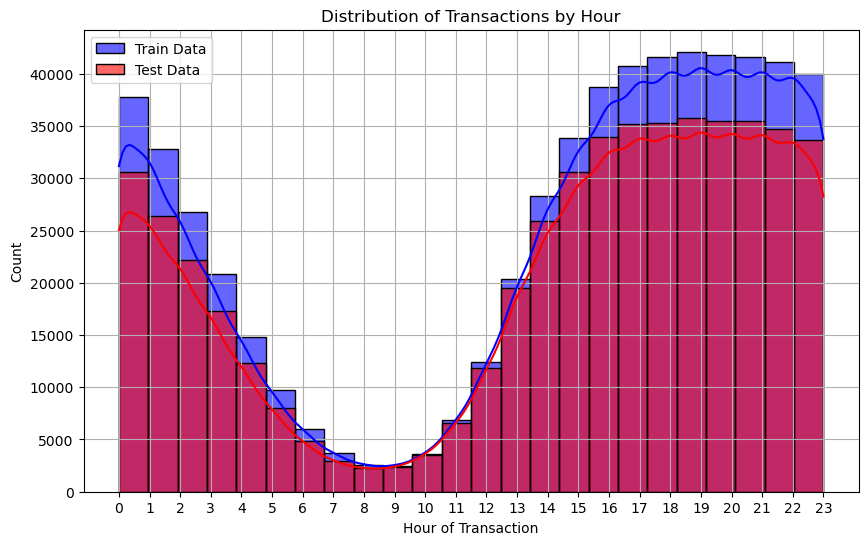

In [285]:
plt.figure(figsize=(10, 6))
sns.histplot(df['TransactionHour'], bins=24, kde=True, color="blue", label="Train Data", alpha=0.6)
sns.histplot(df_test['TransactionHour'], bins=24, kde=True, color="red", label="Test Data", alpha=0.6)
plt.xlabel("Hour of Transaction")
plt.ylabel("Count")
plt.title("Distribution of Transactions by Hour")
plt.xticks(range(0, 24))
plt.legend()
plt.grid(True)
plt.show()

## Frequency-based feature (Count Encoding)

In [320]:
df['CardID'] = df['card1'].astype(str) + '_' + df['card2'].astype(str)
df_test['CardID'] = df_test['card1'].astype(str) + '_' + df_test['card2'].astype(str)

card_counts = df['CardID'].value_counts().to_dict()
card_counts_test=df_test['CardID'].value_counts().to_dict()
df['CardID_Count'] = df['CardID'].map(card_counts)
df_test['CardID_Count'] = df_test['CardID'].map(card_counts_test)

In [245]:
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
print("Numerical Columns:", numerical_cols)

Numerical Columns: Index(['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt', 'card1',
       'card2', 'card3', 'card5', 'addr1', 'addr2',
       ...
       'id_15_category', 'id_16_category', 'id_27_category', 'id_28_category',
       'id_29_category', 'DeviceInfo_category', 'P_email_category',
       'R_email_category', 'TransactionHour', 'CardID_Count'],
      dtype='object', length=431)


In [246]:
print(df.columns.tolist()) 

['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V

In [247]:
for col in df.select_dtypes(include=['object']).columns:
    print(f"Column: {col}")
    print(df[col].unique()[:10])  
    print("-" * 40)

Column: ProductCD
['W' 'H' 'C' 'S' 'R']
----------------------------------------
Column: card4
['discover' 'mastercard' 'visa' 'american express']
----------------------------------------
Column: card6
['credit' 'debit' 'debit or credit' 'charge card']
----------------------------------------
Column: P_emaildomain
['gmail.com' 'outlook.com' 'yahoo.com' 'mail.com' 'anonymous.com'
 'hotmail.com' 'verizon.net' 'aol.com' 'me.com' 'comcast.net']
----------------------------------------
Column: R_emaildomain
['gmail.com' 'hotmail.com' 'outlook.com' 'anonymous.com' 'charter.net'
 'prodigy.net.mx' 'comcast.net' 'live.com.mx' 'icloud.com' 'yahoo.com']
----------------------------------------
Column: M1
['T' 'F']
----------------------------------------
Column: M2
['T' 'F']
----------------------------------------
Column: M3
['T' 'F']
----------------------------------------
Column: M4
['M2' 'M0' 'M1']
----------------------------------------
Column: M5
['F' 'T']
--------------------------------

In [248]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
TransactionID,590540.0,3.282270e+06,1.704744e+05,2987000.000,3134634.750,3282269.500,3429904.25,3.577539e+06
isFraud,590540.0,3.499001e-02,1.837546e-01,0.000,0.000,0.000,0.00,1.000000e+00
TransactionDT,590540.0,7.372311e+06,4.617224e+06,86400.000,3027057.750,7306527.500,11246620.00,1.581113e+07
TransactionAmt,590540.0,1.350272e+02,2.391625e+02,0.251,43.321,68.769,125.00,3.193739e+04
card1,590540.0,9.898735e+03,4.901170e+03,1000.000,6019.000,9678.000,14184.00,1.839600e+04
...,...,...,...,...,...,...,...,...
DeviceInfo_category,590540.0,1.535442e-01,4.438112e-01,0.000,0.000,0.000,0.00,2.000000e+00
P_email_category,590540.0,2.406502e+05,9.275685e+04,100934.000,166795.000,322811.000,322811.00,3.228110e+05
R_email_category,590540.0,4.471014e+05,1.597899e+05,27509.000,510396.000,510396.000,510396.00,5.103960e+05
TransactionHour,590540.0,1.386192e+01,7.607152e+00,0.000,6.000,16.000,20.00,2.300000e+01


In [249]:
high_cardinality_cols = df.nunique()[df.nunique() > 100].index.tolist()
print("Columns with high cardinality:", high_cardinality_cols)

Columns with high cardinality: ['TransactionID', 'TransactionDT', 'TransactionAmt', 'card1', 'card2', 'card3', 'card5', 'addr1', 'dist1', 'dist2', 'C1', 'C2', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'V95', 'V96', 'V97', 'V101', 'V102', 'V103', 'V105', 'V126', 'V127', 'V128', 'V129', 'V130', 'V131', 'V132', 'V133', 'V134', 'V135', 'V136', 'V137', 'V143', 'V145', 'V150', 'V159', 'V160', 'V162', 'V163', 'V164', 'V165', 'V166', 'V167', 'V168', 'V177', 'V178', 'V179', 'V187', 'V202', 'V203', 'V204', 'V205', 'V206', 'V207', 'V208', 'V209', 'V210', 'V211', 'V212', 'V213', 'V214', 'V215', 'V216', 'V217', 'V218', 'V219', 'V231', 'V232', 'V233', 'V234', 'V263', 'V264', 'V265', 'V266', 'V267', 'V268', 'V269', 'V270', 'V271', 'V272', 'V273', 'V274', 'V275', 'V276', 'V277', 'V278', 'V279', 'V280', 'V291', 'V292', 'V293', 'V294', 'V295', 'V306', 'V307', 'V308', 'V309', 'V310', 'V3

In [250]:
df_train=df[['isFraud','TransactionHour',	'TransactionAmt','CardID_Count','DeviceInfo_category','P_email_category','R_email_category',
             'product_cd_category','card4_category','card6_category','M1_category','M2_category','M3_category','M5_category',
             'M6_category','M7_category','M8_category','M9_category','id_35_category','id_36_category','id_37_category',
             'id_38_category','device_category','ip_category','id_12_category','id_15_category','id_16_category','id_27_category',
             'id_28_category','id_29_category']]

In [336]:
df_test_feat=df_test[[ 'TransactionHour',	'TransactionAmt','CardID_Count','DeviceInfo_category','P_email_category','R_email_category',
             'product_cd_category','card4_category','card6_category','M1_category','M2_category','M3_category','M5_category',
             'M6_category','M7_category','M8_category','M9_category','id_35_category','id_36_category','id_37_category',
             'id_38_category','device_category','ip_category','id_12_category','id_15_category','id_16_category','id_27_category',
             'id_28_category','id_29_category']]

In [252]:
# df.drop(['P_emaildomain', 'R_emaildomain','DeviceType','DeviceInfo'], axis=1, inplace=True)
# df_test.drop(['P_emaildomain', 'R_emaildomain','DeviceType','DeviceInfo'], axis=1, inplace=True)

In [253]:
df_train.head()

,isFraud,TransactionHour,TransactionAmt,CardID_Count,DeviceInfo_category,P_email_category,R_email_category,product_cd_category,card4_category,card6_category,...,id_37_category,id_38_category,device_category,ip_category,id_12_category,id_15_category,id_16_category,id_27_category,id_28_category,id_29_category
0,0,0,68.5,6,0,322811,510396,0,0,0,...,0,1,0,0,1,0,0,0,0,0
1,0,0,29.0,678,0,322811,510396,0,1,0,...,0,1,0,0,1,0,0,0,0,0
2,0,0,59.0,1104,0,166795,510396,0,2,1,...,0,1,0,0,1,0,0,0,0,0
3,0,0,50.0,4197,0,100934,510396,0,1,1,...,0,1,0,0,1,0,0,0,0,0
4,0,0,50.0,18,1,322811,510396,1,1,0,...,0,0,1,0,1,2,1,0,2,1


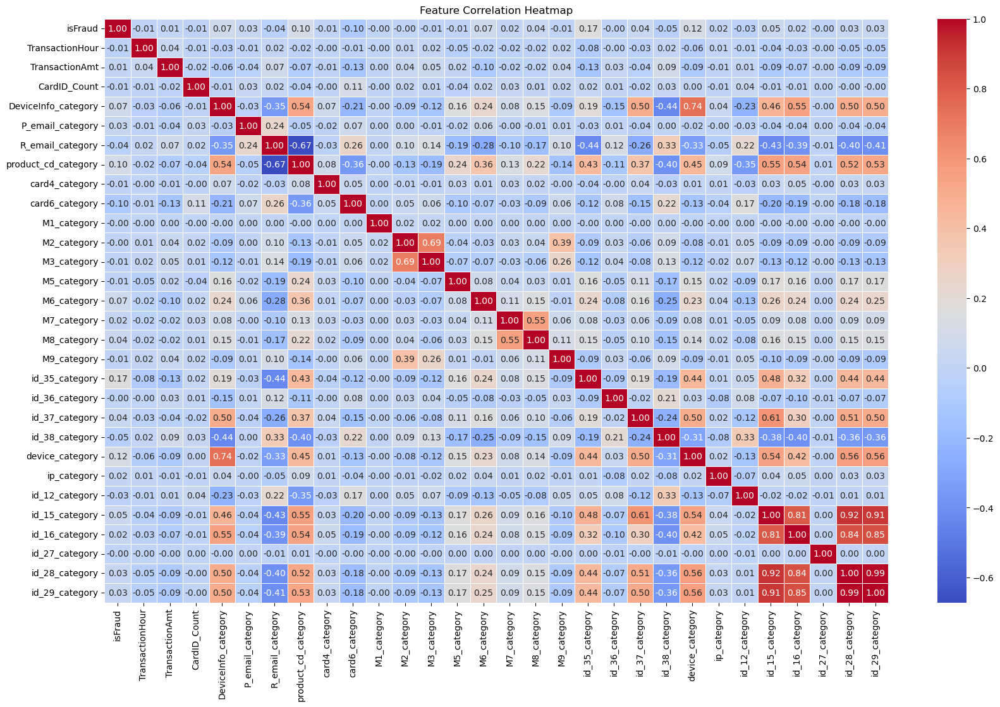

In [287]:
correlation_matrix = df_train.corr()
plt.figure(figsize=(20, 12))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Feature Correlation Heatmap")
plt.show()

## 3. Handling Imbalanced Data:

- SMOTE (Synthetic Minority Over-sampling Technique)
- Class Weighting in Loss Function

In [291]:
labels = df['isFraud']
df_train.drop(columns=['isFraud'], inplace=True)

/var/folders/3q/gmr6b7zs7ns8f20xc16hk7t40000gn/T/ipykernel_56326/1384158506.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train.drop(columns=['isFraud'], inplace=True)


In [293]:
X_train,y_train=df_train,labels

In [261]:
# labels_test = df_test['isFraud']
# df_test.drop(columns=['isFraud'], inplace=True)

In [262]:
# X_test,y_test=df,labels_test

In [263]:
# X_train, X_val, y_train, y_val = train_test_split(df_train, labels, test_size=0.2, stratify=labels, random_state=42)

In [264]:
# labels_test=df_test['isFraud']
# df_test.drop(columns=['isFraud'], inplace=True)

In [366]:
X_test=df_test_feat
X_test.head()
# X_test.drop(columns=['anomaly_iso'], inplace=True)

,TransactionHour,TransactionAmt,CardID_Count,DeviceInfo_category,P_email_category,R_email_category,product_cd_category,card4_category,card6_category,M1_category,...,id_37_category,id_38_category,device_category,ip_category,id_12_category,id_15_category,id_16_category,id_27_category,id_28_category,id_29_category
0,0,31.95,75,0,322811,510396,0,2,1,0,...,0,1,0,0,1,0,0,0,0,0
1,0,49.00,952,0,166795,510396,0,2,1,0,...,0,1,0,0,1,0,0,0,0,0
2,0,171.00,33,0,166795,510396,0,2,1,0,...,0,1,0,0,1,0,0,0,0,0
3,0,284.95,833,0,322811,510396,0,2,1,0,...,0,1,0,0,1,0,0,0,0,0
4,0,67.95,1209,0,322811,510396,0,1,1,0,...,0,1,0,0,1,0,0,0,0,0


In [328]:
X_train.head()

,TransactionHour,TransactionAmt,CardID_Count,DeviceInfo_category,P_email_category,R_email_category,product_cd_category,card4_category,card6_category,M1_category,...,id_37_category,id_38_category,device_category,ip_category,id_12_category,id_15_category,id_16_category,id_27_category,id_28_category,id_29_category
0,0,68.5,6,0,322811,510396,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
1,0,29.0,678,0,322811,510396,0,1,0,0,...,0,1,0,0,1,0,0,0,0,0
2,0,59.0,1104,0,166795,510396,0,2,1,0,...,0,1,0,0,1,0,0,0,0,0
3,0,50.0,4197,0,100934,510396,0,1,1,0,...,0,1,0,0,1,0,0,0,0,0
4,0,50.0,18,1,322811,510396,1,1,0,0,...,0,0,1,0,1,2,1,0,2,1


## SMOTE - For Balancing the dataset and Class weighting in Loss Function 

In [368]:
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)


class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weight_dict = {0: class_weights[0], 1: class_weights[1]}

## Isolation Forest 

- Hyperparamters (optimized)

  i. contamination =0.5

  ii.  random-state=42 

In [370]:
iso_forest = IsolationForest(contamination=0.4, random_state=42)
iso_forest.fit(X_train)

IsolationForest(contamination=0.5, random_state=42)

In [374]:
X_test['anomaly_iso'] = iso_forest.predict(X_test)
#X_test['anomaly_svm'] = oc_svm.predict(X_test)

/var/folders/3q/gmr6b7zs7ns8f20xc16hk7t40000gn/T/ipykernel_56326/813550277.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test['anomaly_iso'] = iso_forest.predict(X_test)


In [382]:
X_test['anomaly_iso'] = X_test['anomaly_iso'].apply(lambda x: 1 if x ==-1  else 0)

/var/folders/3q/gmr6b7zs7ns8f20xc16hk7t40000gn/T/ipykernel_56326/680521075.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test['anomaly_iso'] = X_test['anomaly_iso'].apply(lambda x: 1 if x ==-1  else 0)


In [391]:
y_test=X_test['anomaly_iso']
X_test.drop(columns=['anomaly_iso'], inplace=True)

/var/folders/3q/gmr6b7zs7ns8f20xc16hk7t40000gn/T/ipykernel_56326/3339503666.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.drop(columns=['anomaly_iso'], inplace=True)


## XGBClassifier model

Hyperparamaters - 

- scale_pos_weight=2
- n_estimators=300
- max_depth=6
- learning_rate=0.06
-  random_state=62

In [440]:
xgb = XGBClassifier(scale_pos_weight=2, n_estimators=300, max_depth=6, learning_rate=0.06, random_state=62)
xgb.fit(X_train_smote, y_train_smote)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.06, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=300, n_jobs=None,
              num_parallel_tree=None, random_state=62, ...)

In [458]:
y_probs = xgb.predict_proba(X_test)[:, 1]
y_pred = (y_probs >= 0.5).astype(int)

In [474]:
precision, recall, _ = precision_recall_curve(y_test, y_pred )
pr_auc = auc(recall, precision)
roc_auc = roc_auc_score(y_test, y_probs)
print("\nHybrid Model Classification Report (XGBoost + Anomaly Scores):")
print(classification_report(y_test, xgb.predict(X_test)))

print(f"Precision-Recall AUC: {pr_auc:.4f}")
print(f"AUC-ROC Score: {roc_auc=:.4f}")




Hybrid Model Classification Report (XGBoost + Anomaly Scores):
              precision    recall  f1-score   support

           0       0.50      0.81      0.62    226347
           1       0.69      0.34      0.46    280344

    accuracy                           0.55    506691
   macro avg       0.60      0.58      0.54    506691
weighted avg       0.61      0.55      0.53    506691

Precision-Recall AUC: 0.9992
AUC-ROC Score: 0.7751


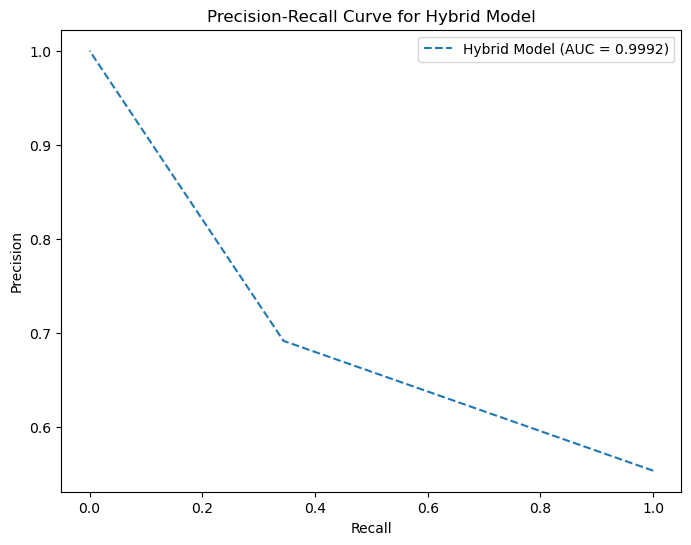

In [476]:

plt.figure(figsize=(8, 6))
plt.plot(recall, precision, label=f"Hybrid Model (AUC = {pr_auc:.4f})", linestyle='dashed')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve for Hybrid Model")
plt.legend()
plt.show()


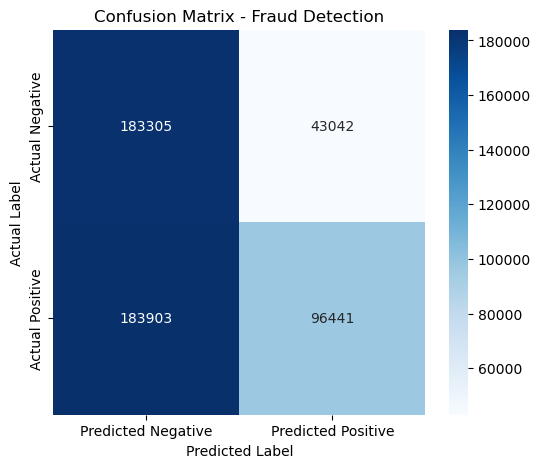

In [472]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Predicted Negative", "Predicted Positive"], yticklabels=["Actual Negative", "Actual Positive"])
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.title("Confusion Matrix - Fraud Detection")
plt.show()

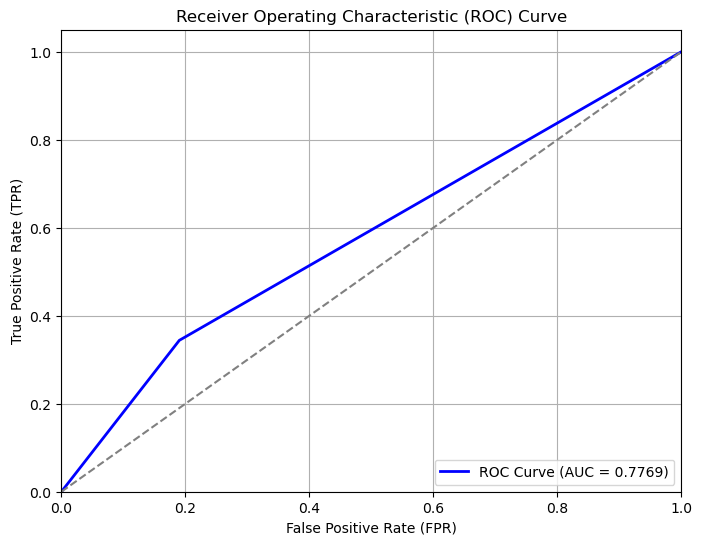

In [486]:
fpr, tpr, _ = roc_curve(y_test, y_pred)

roc_auc = roc_auc_score(y_test, y_pred)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f"ROC Curve (AUC = {roc_auc:.4f})")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Diagonal line for random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate (FPR)")
plt.ylabel("True Positive Rate (TPR)")
plt.title("Receiver Operating Characteristic (ROC) Curve")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

## Accruacy and Loss 

In [508]:
accuracy = accuracy_score(y_test, y_pred)
print(f"Model Accuracy: {accuracy:.4f}")
loss = log_loss(y_test, y_pred)
print(f"Model Log Loss: {loss:.4f}")

Model Accuracy: 0.9121
Model Log Loss: 0.7438
